# <h1><center><font color='red'>CARDIOVASCULAR DISEASE PREDICTION</font></center></h1> 

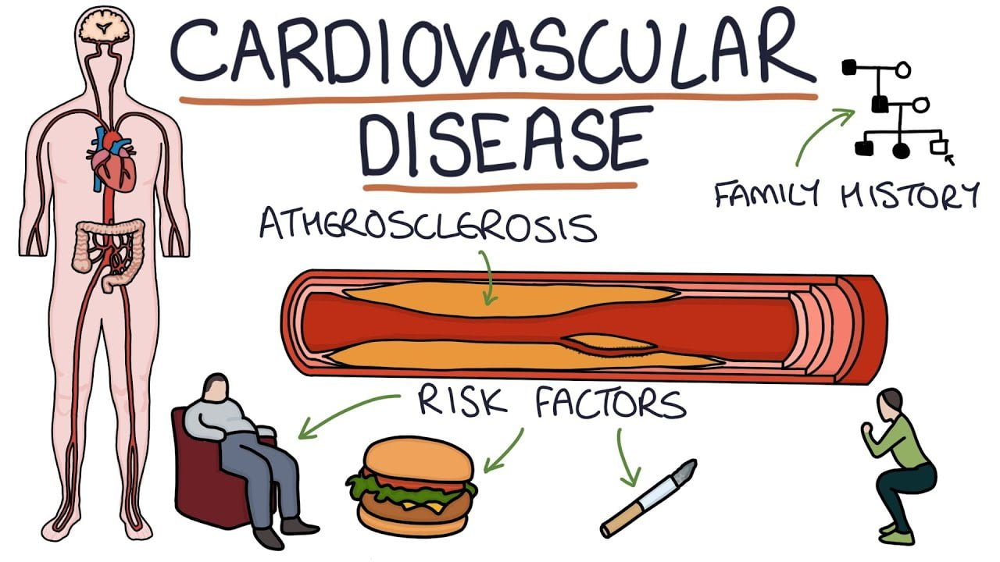 

### <font color='red'>Table of contents<a name="TABLE"></a>
1. [OVERVIEW](#OVERVIEW)  
2. [IMPORT LIBRARIES AND DATASETS](#IMPORT) 
3. [EXPLORATORY DATA ANALYSIS](#EXPLORATORY) 
4. [DATASET VISUALIZATION](#VISUALIZATION) 
    1. [QUICKSIGHT VISUALIZATION](#QUICKSIGHT) 
    2. [PYTHON'S SEABORN & MATPLOTLIB VISUALIZATION](#PYTHON)
5. [CREATE TRAINING AND TESTING DATASET](#TRAINING/TESTING) 
6. [TRAIN AND TEST MODEL IN SK-LEARN NOT USING SAGEMAKER](#SK-LEARN) 
    1. [HYPERPARAMETER TUNING ON MULTIPLE MODELS - CLASSIFICATION](#Hyperparameter)
    2. [APPLY GRIDSEARCHCV TO FIND BEST PARAMETER FOR THE 2 BEST MODEL](#Gridsearchcv)
    3. [Apply Gridsearchcv to find best parameter for the 2 best Model](#Gridsearchcv)
        1. [MODEL 1](#model1)
        2. [MODEL 2](#model2)
7. [TRAIN/TUNE/DEPLOY MODEL USING SAGEMAKER STUDIO](#using-sagemaker)
8. [SAGEMAKER AUTOPILOT](#Autopilot)
9. [SAGEMAKER CANVAS](#canvas)
10. [APPLY PRINCIPAL COMPONENT ANALYSIS](#PCA)
    1. [DIMENSIONALITY REDUCTION USING PCA (SKLEARN)](#PCA-SKLEARN)
    2. [DIMENSIONALITY REDUCTION USING PCA ( USING SAGEMAKER)](#PCA-SAGEMAKER)
11. [TRAIN MODEL USING DEEP LEARNING](#Deep-learning)
    1. [BUILDING ANN](#building_ann)
    2. [TRAINING ANN](#training_ann)
    3. [EVALUATING ANN](#evaluating_ann)
12. [CONCLUSION](#CONCLU) 

#### <center> [Back to Top](#TABLE)  

http://localhost:8888/notebooks/AWS%20Practical/4.%20Cardiovascular%20Disease%20Prediction/SageMakerAutopilotDataExplorationNotebook.ipynb

## <font color='red'> 1. OVERVIEW<a name="OVERVIEW"></a> 


Cardiovascular diseases (CVDs) are a group of disorders of the heart and blood vessels. 

Aim of the problem is to detect the presence or absence of cardiovascular disease in person based on the given features.
Features available are:


- Age | Objective Feature | age | int (days)
- Height | Objective Feature | height | int (cm) |
- Weight | Objective Feature | weight | float (kg) |
- Gender | Objective Feature | gender | categorical code | 1: Women, 2: Male
- Systolic blood pressure | Examination Feature | ap_hi | int |
- Diastolic blood pressure | Examination Feature | ap_lo | int |
- Cholesterol | Examination Feature | cholesterol | 1: normal, 2: above normal, 3: well above normal |
- Glucose | Examination Feature | gluc | 1: normal, 2: above normal, 3: well above normal |
- Smoking | Subjective Feature | smoke | binary | 0: Not Smoker, 1: Smoker
- Alcohol intake | Subjective Feature | alco | binary | 0: Not Alcoholic, 1: Alcoholic
- Physical activity | Subjective Feature | active | binary | 0: Not Active, 1: Active
- Presence or absence of cardiovascular disease | Target Variable | cardio | binary | 0: Not CVD, 1: CVD

Note that:
- Objective: factual information;
- Examination: results of medical examination;
- Subjective: information given by the patient.

Data Source:https://www.kaggle.com/sulianova/cardiovascular-disease-dataset

#### <center> [Back to Top](#TABLE)  

## <font color='red'>2. IMPORT LIBRARIES AND DATASETS <a name="IMPORT"></a> 

In [1]:
import warnings
warnings.simplefilter('ignore')

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # For visualization
import matplotlib.pyplot as plt # For visualization
%matplotlib inline 
sns.set_style("whitegrid")# set background color
from scipy import stats#statistics functions

import os#Walking through directores

import plotly.graph_objects as pltly # Generate Graphs
from plotly.subplots import make_subplots #To Create Subplots

from sklearn import decomposition #pca
from sklearn.preprocessing import StandardScaler # Standardization ((X - X_mean)/X_std)

from sklearn.neighbors import KNeighborsClassifier #KNN Model
from sklearn.ensemble import RandomForestClassifier #RandomForest Model
from sklearn.linear_model import LogisticRegression #Logistic Model

from sklearn.model_selection import train_test_split # Splitting into train and test

from sklearn.model_selection import GridSearchCV# Hyperparameter Tuning
from sklearn.model_selection import cross_val_score#cross validation score

from sklearn.metrics import classification_report # text report showing the main classification metrics
from sklearn.metrics import confusion_matrix #to get confusion_matirx 

pd.set_option('display.max_columns', None)#Setting Max Columns Display to Max inorder to get glance of all features in dataframe

In [2]:
# read the csv file 
missing_values = ['?', '--', ' ', 'NA', 'N/A', '-'] #Sometimes Missing Values are't in form of NaN
cardio_df = pd.read_csv("cardio_train.csv", sep=";", na_values= missing_values)


In [3]:
cardio_df.head()

,id,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
0,0,18393,2,168,62.0,110,80,1,1,0,0,1,0
1,1,20228,1,156,85.0,140,90,3,1,0,0,1,1
2,2,18857,1,165,64.0,130,70,3,1,0,0,0,1
3,3,17623,2,169,82.0,150,100,1,1,0,0,1,1
4,4,17474,1,156,56.0,100,60,1,1,0,0,0,0


In [4]:
cardio_df.shape

(70000, 13)

In [5]:
cardio_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 70000 entries, 0 to 69999
Data columns (total 13 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   id           70000 non-null  int64  
 1   age          70000 non-null  int64  
 2   gender       70000 non-null  int64  
 3   height       70000 non-null  int64  
 4   weight       70000 non-null  float64
 5   ap_hi        70000 non-null  int64  
 6   ap_lo        70000 non-null  int64  
 7   cholesterol  70000 non-null  int64  
 8   gluc         70000 non-null  int64  
 9   smoke        70000 non-null  int64  
 10  alco         70000 non-null  int64  
 11  active       70000 non-null  int64  
 12  cardio       70000 non-null  int64  
dtypes: float64(1), int64(12)
memory usage: 6.9 MB


#### <center> [Back to Top](#TABLE)  

## <font color='red'>3. EXPLORATORY DATA ANALYSIS: <a name="EXPLORATORY"></a> 

### Drop unimportant columns & Fixed some value of features

In [6]:
# Drop id
cardio_df = cardio_df.drop(columns = 'id')

In [7]:
# since the age is given in days, we convert it into years
cardio_df['age'] = cardio_df['age']/365

In [8]:
cardio_df['age'] = cardio_df['age'].astype(int)

### Check Null Values/Duplicated rows

In [9]:
# checking the null values
cardio_df.isnull().sum()

age            0
gender         0
height         0
weight         0
ap_hi          0
ap_lo          0
cholesterol    0
gluc           0
smoke          0
alco           0
active         0
cardio         0
dtype: int64

In [10]:
#check duplicated rows
cardio_df[cardio_df.duplicated()]

,age,gender,height,weight,ap_hi,ap_lo,cholesterol,gluc,smoke,alco,active,cardio
842,40,2,165,60.0,120,80,1,1,0,0,0,0
958,49,2,175,89.0,120,80,1,1,0,0,1,0
1855,58,1,165,78.0,120,80,1,1,0,0,1,1
1898,57,1,160,58.0,120,80,1,1,0,0,1,0
3904,42,2,169,65.0,120,80,1,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...
69922,42,1,165,62.0,100,60,1,1,0,0,1,0
69951,41,1,158,55.0,110,70,1,1,0,0,1,0
69983,53,1,165,72.0,120,80,1,1,0,0,1,0
69986,49,2,180,78.0,120,80,1,1,0,0,1,0


In [11]:
#Rename long column name to short name
cardio_df.rename(columns={'cholesterol':'chol'}, inplace=True)

In [12]:
#Remove duplicate rows
cardio_df = cardio_df.drop_duplicates()

In [13]:
cardio_df.shape

(66792, 12)

### Separate Continuous  and Categorical Features

In [14]:
#if unique values is greater than 25, Continuous Feature 
# and less 25 is Categorical Features
list_cont = []
list_cat = []

for f in cardio_df.columns:
    if len(cardio_df[f].unique())>25:
        list_cont.append(f)
    else:
        list_cat.append(f)

print('continous features: ', list_cont) 
print('categorical features: ', list_cat)
        

continous features:  ['age', 'height', 'weight', 'ap_hi', 'ap_lo']
categorical features:  ['gender', 'chol', 'gluc', 'smoke', 'alco', 'active', 'cardio']


## 3.1 Handling Continuous Features

### Check outliers

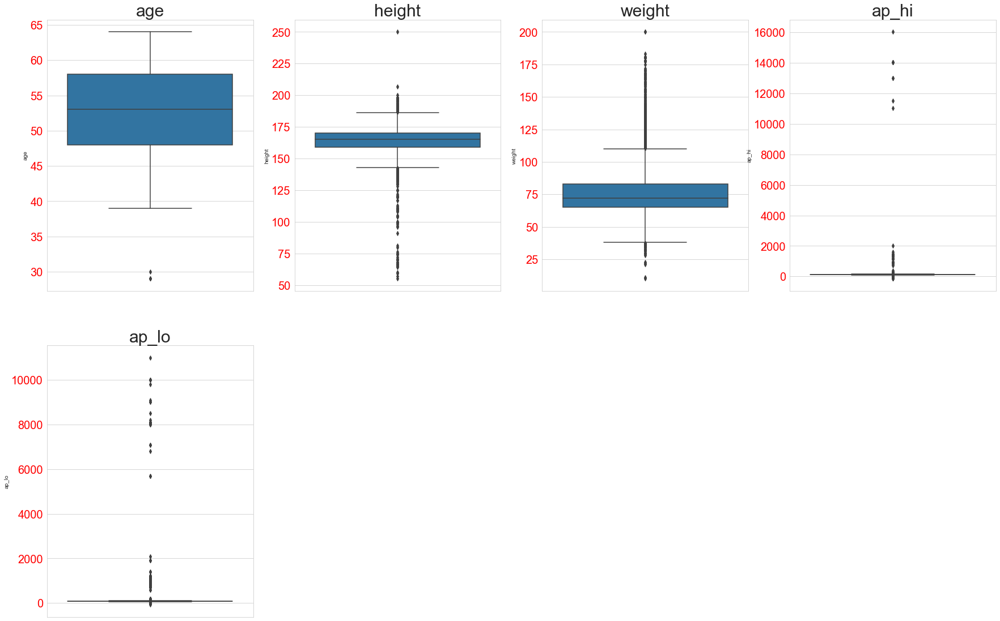

In [15]:
# Create a dictionary of columns.
dic_col = {'age':1, 'height':2, 'weight':3, 'ap_hi': 4, 'ap_lo':5}

# Detect outliers in each variable using box plots.
plt.figure(figsize=(30,30))

for variable,i in dic_col.items():
    plt.subplot(3,4,i)
    
    sns.boxplot(y=cardio_df[variable],data = cardio_df)
    plt.title(variable, size=30)
    plt.yticks(size = 20, color='red')
    
    

In [16]:
cardio_df.describe()

,age,gender,height,weight,ap_hi,ap_lo,chol,gluc,smoke,alco,active,cardio
count,66792.000000,66792.000000,66792.000000,66792.000000,66792.000000,66792.000000,66792.000000,66792.000000,66792.000000,66792.000000,66792.000000,66792.000000
mean,52.859729,1.356210,164.341748,74.521160,129.231585,97.446221,1.382725,1.236106,0.092137,0.056294,0.798539,0.511933
std,6.803670,0.478882,8.333904,14.580675,157.649354,192.906434,0.690132,0.582063,0.289221,0.230491,0.401095,0.499861
min,29.000000,1.000000,55.000000,10.000000,-150.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,48.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,53.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000
75%,58.000000,2.000000,170.000000,83.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,64.000000,2.000000,250.000000,200.000000,16020.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


Observation on the above outliers:
- Age outliers is acceptable, min age = 29 and max= 64 in the data.
- Height outliers are somewhat unacceptable tallest and smallest human recorded were 251.46 and 54.64. data min=55 & max=250. So we need to correct some of the data. 
- Some error note on the weight data, so we need to correct it also. min=10 & max = 200
- There is no negative, above 250, below 50 systolic blood pressure. Need to examine data and correct it also.
- Same to wiht diastolic BP no negative, No below 20 and above 200. Need to check for also for typographical error.180/120 is an emergency BP, Normal is 120/80. 


###  Fix Outlier Weight and Height

In [17]:
fig = pltly.Figure()

fig.add_trace(pltly.Box(x=cardio_df['height'], name = 'Height', boxpoints='outliers',))
fig.add_trace(pltly.Box(x=cardio_df['weight'], name = 'Weight', boxpoints='outliers',))

fig.update_layout(title_text="Box Plot for Weight and Height with Outliers")
fig.show()

We can observe lot's of outliers ( Points below Lower Fence and Above Upper Fence )
To explain more about Outliers and result of this Box Plot, I'll use IQR Interquartile Range

In [18]:
def outliers(df_out, drop = False):
    for each_feature in df_out.columns:
        feature_data = df_out[each_feature]
        Q1 = np.percentile(feature_data, 25.) # 25th percentile of the data of the given feature
        Q3 = np.percentile(feature_data, 75.) # 75th percentile of the data of the given feature
        IQR = Q3-Q1 #Interquartile Range
        outlier_step = IQR * 1.5 #That's we were talking about above
        outliers = feature_data[~((feature_data >= Q1 - outlier_step) & (feature_data <= Q3 + outlier_step))].index.tolist()  
        print('For the feature {}, No of Outliers is {}'.format(each_feature, len(outliers)))
outliers(cardio_df[['height', 'weight']])

For the feature height, No of Outliers is 519
For the feature weight, No of Outliers is 1282


In [19]:
cardio_df_clean = cardio_df.copy()
cardio_df_clean[['height', 'weight']] = np.log(cardio_df_clean[['height', 'weight']])
outliers(cardio_df_clean[['height', 'weight']])

For the feature height, No of Outliers is 484
For the feature weight, No of Outliers is 1031


#### 0.005 and 0.995 Quantile range to handle the remaining outliers
- weight min(0.005) = 45 kg

- weight max(0.995) = 126 kg

- height(0.005) = 114 cm

- height(0.995) = 186 cm

In [20]:
#Clean the data
cardio_df_clean = cardio_df_clean[(cardio_df_clean['weight'] > cardio_df_clean['weight'].quantile(0.005)) & (cardio_df_clean['weight'] < cardio_df_clean['weight'].quantile(0.995))]
cardio_df_clean = cardio_df_clean[(cardio_df_clean['height'] > cardio_df_clean['height'].quantile(0.005)) & (cardio_df_clean['height'] < cardio_df_clean['height'].quantile(0.995))]
outliers(cardio_df_clean[['height', 'weight']])

For the feature height, No of Outliers is 0
For the feature weight, No of Outliers is 387


In [21]:
#reverse to original using exp function after converting it to log
cardio_df_clean[['height', 'weight']] = np.exp(cardio_df_clean[['height', 'weight']])


In [22]:
cardio_df_clean

,age,gender,height,weight,ap_hi,ap_lo,chol,gluc,smoke,alco,active,cardio
0,50,2,168.0,62.0,110,80,1,1,0,0,1,0
1,55,1,156.0,85.0,140,90,3,1,0,0,1,1
2,51,1,165.0,64.0,130,70,3,1,0,0,0,1
3,48,2,169.0,82.0,150,100,1,1,0,0,1,1
4,47,1,156.0,56.0,100,60,1,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
69993,53,1,172.0,70.0,130,90,1,1,0,0,1,1
69994,57,1,165.0,80.0,150,80,1,1,0,0,1,1
69997,52,2,183.0,105.0,180,90,3,1,0,1,0,1
69998,61,1,163.0,72.0,135,80,1,2,0,0,0,1


In [23]:
print('Number of outliers deleted is {} datapoints'.format(len(cardio_df)-len(cardio_df_clean)))

Number of outliers deleted is 1590 datapoints


### Fixing the Blood Pressure Features Systolic(ap_hi) & Diastolic(ap_lo)

#### We can see that the column "ap_hi" and ap_lo is the Blood Pressure, Systolic(ap_hi) and diastolic(ap_lo). The normal BP is 120/80. We observe that there are typographical error on the data of column ap_hi and ap_lo. There is no negative value of BP, and BP is in the range of about 200 to 50. So we will clean and fixed some of the data. 

In [24]:
#make a copy of the outliers clean data
cardio_df = cardio_df_clean.copy()

### Sytolic blood pressure

#### I made a code to clean and fixed the ap_lo column. Systolic BP range(80-240)

In [25]:
for index in cardio_df.index:
    
    if cardio_df.loc[index, 'ap_hi']<1:
        cardio_df.loc[index, 'ap_hi'] = int(str(cardio_df.loc[index, 'ap_hi']).replace('-',''))
        #array([-100, -115, -140, -120, -150], dtype=int64)
        
    elif (cardio_df.loc[index, 'ap_hi']>=800) & (cardio_df.loc[index, 'ap_hi']<1000):
        cardio_df.loc[index, 'ap_hi'] = int(str(cardio_df.loc[index,'ap_hi'])[0:2])
        #array([902, 906, 909,  907, 806, 960], dtype=int64)
        
    elif (cardio_df.loc[index, 'ap_hi']>250) & (cardio_df.loc[index, 'ap_hi']<800):
        cardio_df.loc[index, 'ap_hi'] = int(str(cardio_df.loc[index,'ap_hi'])[0:2])
        cardio_df.loc[index, 'ap_hi'] = int("1" + str(cardio_df.loc[index,'ap_hi']))
        #array([309, 401, 701], dtype=int64)
        
           
    elif cardio_df.loc[index, 'ap_hi'] >= 1000:
        cardio_df.loc[index, 'ap_hi'] = int(str(cardio_df.loc[index,'ap_hi'])[0:3])
        #array([11500,  1420,  1500, 14020,  1400,  1620,  1130, 16020,  1202,
        #1300,  1409, 11020, 13010,  1110,  1205,  2000], dtype=int64)

    elif (cardio_df.loc[index, 'ap_hi']==1):
        cardio_df.loc[index, 'ap_hi'] = int(str(cardio_df.loc[index, 'ap_hi'])+'00')
               
    elif (cardio_df.loc[index, 'ap_hi']>=10) & (cardio_df.loc[index, 'ap_hi'] < 30):
        cardio_df.loc[index, 'ap_hi'] = int("1" + str(cardio_df.loc[index, 'ap_hi']))
        #array([14, 11, 12, 10, 16, 15, 17, 13, 20, 24], dtype=int64)
              
    elif (cardio_df.loc[index, 'ap_hi']>=30) & (cardio_df.loc[index, 'ap_hi'] <= 70):
        cardio_df.loc[index, 'ap_hi'] = 90
        #array([70, 60], dtype=int64)
        
    elif (cardio_df.loc[index, 'ap_hi']>1) & (cardio_df.loc[index, 'ap_hi'] < 10):
        cardio_df.loc[index, 'ap_hi'] = 90
        #array([7], dtype=int64)
        

    else:
         continue

In [26]:
#Convert the 0 values to null and fill it with the mean value.
cardio_df['ap_hi'] = cardio_df['ap_hi'].replace(0, np.nan)
cardio_df['ap_hi'] = cardio_df['ap_hi'].fillna(value=127)


In [27]:
#Reset it index to start to zero
cardio_df = cardio_df.reset_index(drop=True)

In [28]:
cardio_df.describe()

,age,gender,height,weight,ap_hi,ap_lo,chol,gluc,smoke,alco,active,cardio
count,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000
mean,52.864452,1.356584,164.461013,74.362290,127.277123,97.194181,1.381660,1.235300,0.091976,0.056133,0.798626,0.511886
std,6.797676,0.478994,7.559571,13.552124,17.291593,190.136060,0.689591,0.581326,0.288994,0.230181,0.401030,0.499863
min,29.000000,1.000000,146.000000,45.800000,80.000000,-70.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,48.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,54.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000
75%,58.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,64.000000,2.000000,185.000000,125.000000,240.000000,11000.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


#### We can now see that the minimum of ap_hi(systolic) is 80 and max is 240. 

#### I made a code to clean and fixed the ap_lo column. Diastolic BP range(110-50)

In [29]:
for index in cardio_df.index:
    
    if cardio_df.loc[index, 'ap_lo']<0:
        cardio_df.loc[index, 'ap_lo'] = int(str(cardio_df.loc[index, 'ap_lo']).replace('-',''))
        #array([-70], dtype=int64)
     
    elif cardio_df.loc[index,'ap_lo']==1:
        cardio_df.loc[index, 'ap_lo'] = 100
    
    elif (cardio_df.loc[index,'ap_lo']>1) & (cardio_df.loc[index, 'ap_lo']<=10):
        cardio_df.loc[index, 'ap_lo'] = int(str(cardio_df.loc[index,'ap_lo'])+"0")
        #array([10,  8,  7,  6,  9], dtype=int64)
    
    elif (cardio_df.loc[index, 'ap_lo']>10) & (cardio_df.loc[index, 'ap_lo']<=50):
        cardio_df.loc[index, 'ap_lo'] = 50
        #array([30, 40, 20, 45, 15, 49], dtype=int64)
        
    elif (cardio_df.loc[index, 'ap_lo']>110) & (cardio_df.loc[index, 'ap_lo']<150):
        cardio_df.loc[index, 'ap_lo'] = 110
        #array([110, 120, 119, 140, 125, 115, 130, 113, 112, 126, 121, 114, 111,
       #118, 122, 135, 150], dtype=int64)
        
    elif (cardio_df.loc[index, 'ap_lo']>=150) & (cardio_df.loc[index, 'ap_lo']<=200):
        cardio_df.loc[index, 'ap_lo'] = int(str(cardio_df.loc[index, 'ap_lo'])[1:])
        #array([170, 160, 180, 182, 190], dtype=int64)
        
    elif (cardio_df.loc[index, 'ap_lo']>200)&(cardio_df.loc[index, 'ap_lo']<1000):
        cardio_df.loc[index, 'ap_lo'] = int(str(cardio_df.loc[index, 'ap_lo'])[0:2])
       # array([800, 902, 802, 850, 708, 709, 710, 809, 801, 810, 820, 900, 700,
       #910, 901, 880, 870, 585, 602], dtype=int64)
        
    elif (cardio_df.loc[index,'ap_lo']>=1000) & (cardio_df.loc[index, 'ap_lo']<=1100):
        cardio_df.loc[index, 'ap_lo'] = int(str(cardio_df.loc[index,'ap_lo'])[0:3])
        #array([1100, 1000, 1033, 1001, 1044, 1008, 1022, 1011, 1007, 1088, 1077,
       #1003, 1002], dtype=int64)
        
    elif (cardio_df.loc[index,'ap_lo']>1100) & (cardio_df.loc[index, 'ap_lo']<=2500):
        cardio_df.loc[index, 'ap_lo'] = 110
        #array([1200, 2088, 1177, 1110, 1120, 1125, 1111, 1900, 1139, 1400, 1101,
       #1140, 1211], dtype=int64)
        
    elif (cardio_df.loc[index, 'ap_lo']>2500)&(cardio_df.loc[index, 'ap_lo']<10000):
            cardio_df.loc[index, 'ap_lo'] = int(str(cardio_df.loc[index, 'ap_lo'])[0:2])
            #array([8044, 9100, 8000, 9011, 7100, 8500, 8099, 8100, 5700, 8079, 7099,
       #9800, 8200, 6800, 8077], dtype=int64)
 
    elif cardio_df.loc[index, 'ap_lo']>=10000:
        cardio_df.loc[index, 'ap_lo'] = int(str(cardio_df.loc[index, 'ap_lo'])[0:3])
        #array([10000, 11000], dtype=int64)
             
    else:
        continue

In [30]:
#Convert the 0 values to null and fill it with the mean value.
cardio_df['ap_lo'] = cardio_df['ap_lo'].replace(0, np.nan)
cardio_df['ap_lo'] = cardio_df['ap_lo'].fillna(value=82)

In [31]:
#Reset it index to start to zero
cardio_df = cardio_df.reset_index(drop=True)

In [32]:
cardio_df.describe()

,age,gender,height,weight,ap_hi,ap_lo,chol,gluc,smoke,alco,active,cardio
count,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000,65202.000000
mean,52.864452,1.356584,164.461013,74.362290,127.277123,81.636499,1.381660,1.235300,0.091976,0.056133,0.798626,0.511886
std,6.797676,0.478994,7.559571,13.552124,17.291593,9.720628,0.689591,0.581326,0.288994,0.230181,0.401030,0.499863
min,29.000000,1.000000,146.000000,45.800000,80.000000,50.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000
25%,48.000000,1.000000,159.000000,65.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,0.000000
50%,54.000000,1.000000,165.000000,72.000000,120.000000,80.000000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000
75%,58.000000,2.000000,170.000000,82.000000,140.000000,90.000000,2.000000,1.000000,0.000000,0.000000,1.000000,1.000000
max,64.000000,2.000000,185.000000,125.000000,240.000000,110.000000,3.000000,3.000000,1.000000,1.000000,1.000000,1.000000


#### We can now see that the minimum of ap_lo(Diastolic) is 50 and max is 110. 

###  Correct Systolic BP should be higher than the Diastolic BP.

In [33]:
#let us check Systolic<Diastolic
BP_error = cardio_df[cardio_df['ap_hi']<cardio_df['ap_lo']]
BP_error

,age,gender,height,weight,ap_hi,ap_lo,chol,gluc,smoke,alco,active,cardio
625,56,2,169.0,68.0,90,110.0,1,1,0,0,1,0
2921,60,2,182.0,90.0,80,110.0,3,3,0,0,1,1
3368,54,2,180.0,80.0,80,110.0,3,3,1,1,1,1
3541,59,1,160.0,83.0,80,110.0,1,1,0,0,1,0
4711,53,2,164.0,89.0,90,110.0,2,2,0,0,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...
61388,39,1,165.0,65.0,80,110.0,1,1,0,0,1,0
62192,53,2,160.0,81.0,80,110.0,3,3,1,1,1,1
62873,64,1,153.0,74.0,80,110.0,1,1,0,0,1,1
62915,58,2,172.0,57.0,80,110.0,1,1,1,0,1,1


#### Remove Systolic=Diastolic


In [34]:
#let us check Systolic=Diastolic
BP_equal = cardio_df[cardio_df['ap_hi']==cardio_df['ap_lo']]
BP_equal

,age,gender,height,weight,ap_hi,ap_lo,chol,gluc,smoke,alco,active,cardio
12373,43,2,178.0,105.0,100,100.0,1,1,0,0,0,1
30671,63,1,162.0,120.0,100,100.0,1,1,0,0,1,0


In [35]:
#interchange value of columns ap_hi & ap_lo
for index in cardio_df.index:
    
    if cardio_df.loc[index, 'ap_hi']<cardio_df.loc[index, 'ap_lo']:
        cardio_df.loc[index,'ap_hi'], cardio_df.loc[index,'ap_lo'] = cardio_df.loc[index,'ap_lo'], cardio_df.loc[index,'ap_hi']
    
    

In [36]:
#Drop the rows with systolic and diastolic is equal
cardio_df = cardio_df.drop(index=BP_equal.index)

In [37]:
#Reset it index to start to zero
cardio_df = cardio_df.reset_index(drop=True)

### Add New Continuous Columns

In [38]:
#Add BMI=(W/H**2) Features, we convert 1st height to meter and weight to kg.
def BMI(data):
    return data['weight'] / (data['height']/100)**2 # convert cm to meter
 
cardio_df['bmi'] = cardio_df.apply(BMI, axis=1)


In [39]:
fig = pltly.Figure()

fig.add_trace(pltly.Box(x=cardio_df['bmi'], name = 'bmi', boxpoints='outliers',))

fig.update_layout(title_text="Box Plot for BMI with Outliers")
fig.show()

- Underweight <18.5 
- Normal weight: 18.5-24.9 
- Overweight: 25-29.9 
- Obesity Class 1: 30-34.9 
- Obesity Class 2: 35-39.9 
- Obesity Class 3 >40

In [40]:
cardio_df = cardio_df.round(2)

In [41]:
cardio_df.columns

Index(['age', 'gender', 'height', 'weight', 'ap_hi', 'ap_lo', 'chol', 'gluc',
       'smoke', 'alco', 'active', 'cardio', 'bmi'],
      dtype='object')

In [42]:
#re-arrange columns
cardio_df = cardio_df[['age', 'gender', 'height', 'weight', 'bmi', 'ap_hi', 'ap_lo', 'chol',
       'gluc', 'smoke', 'alco', 'active', 'cardio']]

In [43]:
cardio_df.describe().round(2)

,age,gender,height,weight,bmi,ap_hi,ap_lo,chol,gluc,smoke,alco,active,cardio
count,65200.00,65200.00,65200.00,65200.00,65200.00,65200.00,65200.00,65200.00,65200.00,65200.00,65200.00,65200.0,65200.00
mean,52.86,1.36,164.46,74.36,27.54,127.31,81.61,1.38,1.24,0.09,0.06,0.8,0.51
std,6.80,0.48,7.56,13.55,5.00,17.24,9.68,0.69,0.58,0.29,0.23,0.4,0.50
min,29.00,1.00,146.00,45.80,14.61,80.00,50.00,1.00,1.00,0.00,0.00,0.0,0.00
25%,48.00,1.00,159.00,65.00,23.88,120.00,80.00,1.00,1.00,0.00,0.00,1.0,0.00
50%,54.00,1.00,165.00,72.00,26.56,120.00,80.00,1.00,1.00,0.00,0.00,1.0,1.00
75%,58.00,2.00,170.00,82.00,30.42,140.00,90.00,2.00,1.00,0.00,0.00,1.0,1.00
max,64.00,2.00,185.00,125.00,56.30,240.00,110.00,3.00,3.00,1.00,1.00,1.0,1.00


In [44]:
cardio_df['ap_lo'] = cardio_df['ap_lo'].astype(int)
cardio_df['ap_hi'] = cardio_df['ap_hi'].astype(int)

In [45]:
#Reset it index to start to zero
cardio_df = cardio_df.reset_index(drop=True)

In [46]:
#if unique values is greater than 25, Continuous Feature 
# and less 25 is Categorical Features
list_cont = []
list_cat = []

for f in cardio_df.columns:
    if len(cardio_df[f].unique())>25:
        list_cont.append(f)
    else:
        list_cat.append(f)

print('continous features: ', list_cont) 
print('categorical features: ', list_cat)
        

continous features:  ['age', 'height', 'weight', 'bmi', 'ap_hi', 'ap_lo']
categorical features:  ['gender', 'chol', 'gluc', 'smoke', 'alco', 'active', 'cardio']


In [47]:
#Make a dictionary for the column w/ it index as number continous columns
dic_cont= {}
for y,x in enumerate(list_cont):
    y = y + 1
    dic_cont[x] = y
    
    
print(dic_cont)  

{'age': 1, 'height': 2, 'weight': 3, 'bmi': 4, 'ap_hi': 5, 'ap_lo': 6}


skewness: -0.3043283825054785  -->  age
skewness: 0.11733244681770304  -->  height
skewness: 0.6805564396919991  -->  weight
skewness: 0.9464210310628756  -->  bmi
skewness: 0.8939944708699634  -->  ap_hi
skewness: 0.16957267013640318  -->  ap_lo


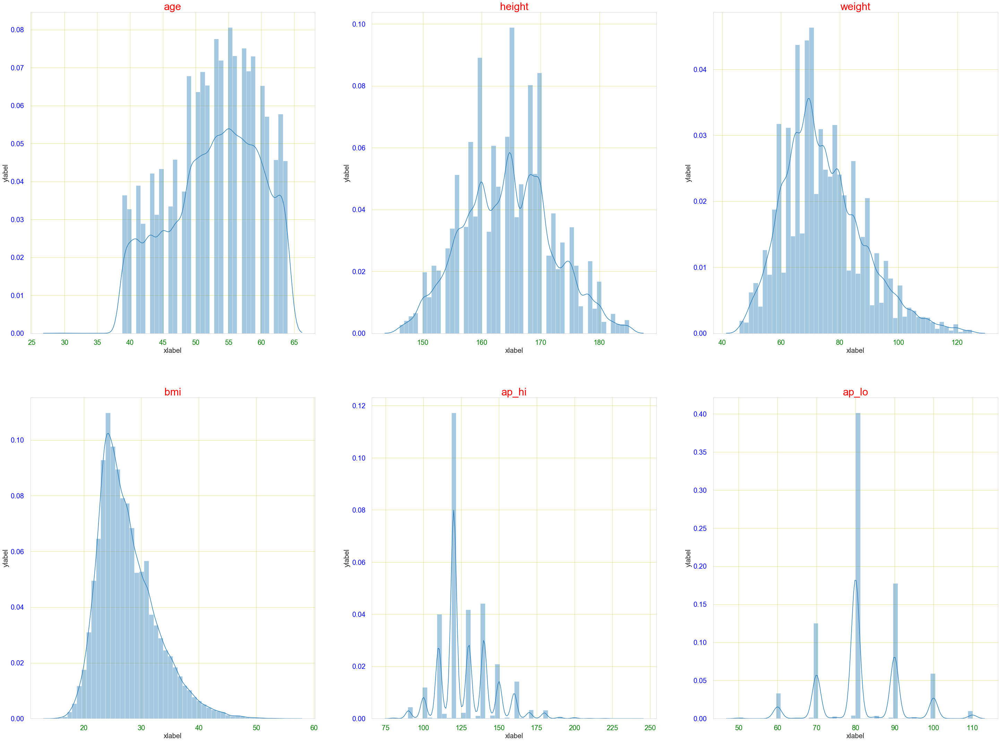

In [48]:
#dictionary of columns.
#dic_cont = {'age': 1, 'height': 2, 'weight': 3, 'bmi': 4, 'ap_hi': 5, 'ap_lo': 6}
from scipy.stats import skew

plt.figure(figsize=(50,50))

for variable,i in dic_cont.items():
    plt.subplot(3,3,i)
    #print(variable," = ", skew(cardio_df_vis[variable]))
    sns.distplot(cardio_df[variable])
    print("skewness: {}".format(skew(cardio_df[variable])), " --> " , variable)

    plt.xlabel('xlabel', fontsize=20)
    plt.ylabel('ylabel', fontsize=20)
    plt.tick_params(direction='out', length=15, width=10, colors='y',
               grid_color='y', grid_alpha=0.5)
    plt.xticks(size = 20, color='green' )
    plt.yticks(size = 20, color='blue')
    plt.title(variable, size = 30, color='red')
    plt.subplots_adjust(top=1)

In [49]:
#Most correlated independent feature to target cardio in ascending order
healthmat = cardio_df.corr()
healthmat['cardio'].sort_values(ascending=False)

cardio    1.000000
ap_hi     0.427331
ap_lo     0.347768
age       0.236662
chol      0.213296
bmi       0.185079
weight    0.175035
gluc      0.080051
gender    0.000458
alco     -0.013397
height   -0.014899
smoke    -0.024397
active   -0.028573
Name: cardio, dtype: float64

#### We can see that the continous feature are approximate  and moderate symmetric. There is no highly skewed. For this data we dont have to do sqrt root or log transformation. we should be also becareful because it will change the pattern in the correlation between the features and target. We can only do transformation to highly skewed w/ little correlation to target. Skewness listed below.
- skewness: -0.3043283825054785  -->  age skewness is between -0.5 & 0.5 so it is approximately symmetric.
- skewness: 0.11733244681770304  -->  height skewness is between -0.5 & 0.5 so it is approximately symmetric.
- skewness: 0.6805564396919991  -->  weight skewness is between 0.5 and 1, moderately positive skewed.
- skewness: 0.9464210310628756  -->  bmi skewness is between 0.5 and 1, moderately positive skewed.
- skewness: 0.8939944708699634  -->  ap_hi skewness is between 0.5 and 1, moderately positive skewed.
- skewness: 0.16957267013640318  -->  ap_lo skewness is between -0.5 & 0.5 so it is approximately symmetric.

## 3.2 Handling Categorical Features

### Add Features for age category

In [50]:
#Age group
for index in cardio_df.index:
    
    if cardio_df.loc[index, "age"] < 40 :
        cardio_df.loc[index, "age_grp"] = "29-39"
    
    elif (cardio_df.loc[index, "age"] >= 40) & (cardio_df.loc[index, "age"] < 50): 
        cardio_df.loc[index, 'age_grp'] = "40-49"
    
    elif (cardio_df.loc[index, "age"] >= 50) & (cardio_df.loc[index, "age"] < 60): 
        cardio_df.loc[index, 'age_grp'] = "50-59"
        
    else:
        cardio_df.loc[index,'age_grp'] = "60-up"  
             

In [51]:
cardio_df.columns

Index(['age', 'gender', 'height', 'weight', 'bmi', 'ap_hi', 'ap_lo', 'chol',
       'gluc', 'smoke', 'alco', 'active', 'cardio', 'age_grp'],
      dtype='object')

In [52]:
#re-arrange columns
cardio_df= cardio_df[['age', 'age_grp', 'gender', 'height', 'weight', 'bmi', 'ap_hi', 'ap_lo', 'chol',
       'gluc', 'smoke', 'alco', 'active', 'cardio']]

In [53]:
cardio_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65200 entries, 0 to 65199
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   age      65200 non-null  int32  
 1   age_grp  65200 non-null  object 
 2   gender   65200 non-null  int64  
 3   height   65200 non-null  float64
 4   weight   65200 non-null  float64
 5   bmi      65200 non-null  float64
 6   ap_hi    65200 non-null  int32  
 7   ap_lo    65200 non-null  int32  
 8   chol     65200 non-null  int64  
 9   gluc     65200 non-null  int64  
 10  smoke    65200 non-null  int64  
 11  alco     65200 non-null  int64  
 12  active   65200 non-null  int64  
 13  cardio   65200 non-null  int64  
dtypes: float64(3), int32(3), int64(7), object(1)
memory usage: 6.2+ MB


In [54]:
#if unique values is greater than 25, Continuous Feature 
# and less 25 is Categorical Features
list_cont = []
list_cat = []

for f in cardio_df.columns:
    if len(cardio_df[f].unique())>25:
        list_cont.append(f)
    else:
        list_cat.append(f)

print('continous features: ', list_cont) 
print('categorical features: ', list_cat)
        

continous features:  ['age', 'height', 'weight', 'bmi', 'ap_hi', 'ap_lo']
categorical features:  ['age_grp', 'gender', 'chol', 'gluc', 'smoke', 'alco', 'active', 'cardio']


In [55]:
#Make a dictionary for the column w/ it index as number categorical colum
categorical_dic = {}
for y,x in enumerate(list_cat):
    y = y + 1
    categorical_dic[x] = y
    
    
print(categorical_dic)  

{'age_grp': 1, 'gender': 2, 'chol': 3, 'gluc': 4, 'smoke': 5, 'alco': 6, 'active': 7, 'cardio': 8}


In [56]:
#label encode age_group
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
categorical = cardio_df.select_dtypes(include = 'object')
for i in categorical:
    cardio_df[i] = le.fit_transform(cardio_df[i])



- 2= 50-59
- 1= 40-49
- 3= 60-above
- 0= 29-39

### Check the unique values and counts of the categorical columns.

In [57]:
#Check the unique values and counts of the categorical columns.
#categorical_df = cardio_df.select_dtypes(include = 'object')
categorical_dic 
for i in categorical_dic:
    column = cardio_df[i]
    print(i.upper())
    print("Number of Unique Values: ", column.nunique())
    print(column.value_counts())
    print('===============')

AGE_GRP
Number of Unique Values:  4
2    32797
1    18347
3    12391
0     1665
Name: age_grp, dtype: int64
GENDER
Number of Unique Values:  2
1    41951
2    23249
Name: gender, dtype: int64
CHOL
Number of Unique Values:  3
1    48124
2     9267
3     7809
Name: chol, dtype: int64
GLUC
Number of Unique Values:  3
1    55009
3     5151
2     5040
Name: gluc, dtype: int64
SMOKE
Number of Unique Values:  2
0    59203
1     5997
Name: smoke, dtype: int64
ALCO
Number of Unique Values:  2
0    61540
1     3660
Name: alco, dtype: int64
ACTIVE
Number of Unique Values:  2
1    52071
0    13129
Name: active, dtype: int64
CARDIO
Number of Unique Values:  2
1    33375
0    31825
Name: cardio, dtype: int64


## 3.3 Make another data_set for visualization purpose

In [58]:
cardio_df_vis = cardio_df.copy()

In [59]:
cardio_df_vis['age_grp']=cardio_df_vis['age_grp'].astype(object)

In [60]:
cardio_df_vis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65200 entries, 0 to 65199
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   age      65200 non-null  int32  
 1   age_grp  65200 non-null  object 
 2   gender   65200 non-null  int64  
 3   height   65200 non-null  float64
 4   weight   65200 non-null  float64
 5   bmi      65200 non-null  float64
 6   ap_hi    65200 non-null  int32  
 7   ap_lo    65200 non-null  int32  
 8   chol     65200 non-null  int64  
 9   gluc     65200 non-null  int64  
 10  smoke    65200 non-null  int64  
 11  alco     65200 non-null  int64  
 12  active   65200 non-null  int64  
 13  cardio   65200 non-null  int64  
dtypes: float64(3), int32(3), int64(7), object(1)
memory usage: 6.2+ MB


### Convert the numeric categorical to equal value name for visual purpose

In [61]:
#change gender
cardio_df_vis['gender'] = cardio_df_vis['gender'].replace(1, "Female")
cardio_df_vis['gender'] = cardio_df_vis['gender'].replace(2, "Male")
#change cholesterol
cardio_df_vis['chol'] = cardio_df_vis['chol'].replace(1, "1Normal")
cardio_df_vis['chol'] = cardio_df_vis['chol'].replace(2, "2Abnormal")
cardio_df_vis['chol'] = cardio_df_vis['chol'].replace(3, "3Hi-Abnorml")
#change glucose
cardio_df_vis['gluc'] = cardio_df_vis['gluc'].replace(1, "1Normal")
cardio_df_vis['gluc'] = cardio_df_vis['gluc'].replace(2, "2Abnormal")
cardio_df_vis['gluc'] = cardio_df_vis['gluc'].replace(3, "3HiAbnorml")
#change smoke
cardio_df_vis['smoke'] = cardio_df_vis['smoke'].replace(0, '0Notsmoke')
cardio_df_vis['smoke'] = cardio_df_vis['smoke'].replace(1, '1smoke')
#change alcoholic
cardio_df_vis['alco'] = cardio_df_vis['alco'].replace(0, "0NotAlcohlc")
cardio_df_vis['alco'] = cardio_df_vis['alco'].replace(1, "1Alcohlc")
#change active
cardio_df_vis['active'] = cardio_df_vis['active'].replace(0, "0NotActive")
cardio_df_vis['active'] = cardio_df_vis['active'].replace(1, "1Active")
#change cardio
cardio_df_vis['cardio'] = cardio_df_vis['cardio'].replace(0, "0NotCVD")
cardio_df_vis['cardio'] = cardio_df_vis['cardio'].replace(1, "1CVD")

In [62]:
#Age group
for index in cardio_df_vis.index:
    
    if cardio_df_vis.loc[index, "age"] < 40 :
        cardio_df_vis.loc[index, "age_grp"] = "29-39"
    
    elif (cardio_df_vis.loc[index, "age"] >= 40) & (cardio_df_vis.loc[index, "age"] < 50): 
        cardio_df_vis.loc[index, 'age_grp'] = "40-49"
    
    elif (cardio_df_vis.loc[index, "age"] >= 50) & (cardio_df_vis.loc[index, "age"] < 60): 
        cardio_df_vis.loc[index, 'age_grp'] = "50-59"
        
    else:
        cardio_df_vis.loc[index,'age_grp'] = "60-up"  
        
   
        

In [63]:
cardio_df_vis

,age,age_grp,gender,height,weight,bmi,ap_hi,ap_lo,chol,gluc,smoke,alco,active,cardio
0,50,50-59,Male,168.0,62.0,21.97,110,80,1Normal,1Normal,0Notsmoke,0NotAlcohlc,1Active,0NotCVD
1,55,50-59,Female,156.0,85.0,34.93,140,90,3Hi-Abnorml,1Normal,0Notsmoke,0NotAlcohlc,1Active,1CVD
2,51,50-59,Female,165.0,64.0,23.51,130,70,3Hi-Abnorml,1Normal,0Notsmoke,0NotAlcohlc,0NotActive,1CVD
3,48,40-49,Male,169.0,82.0,28.71,150,100,1Normal,1Normal,0Notsmoke,0NotAlcohlc,1Active,1CVD
4,47,40-49,Female,156.0,56.0,23.01,100,60,1Normal,1Normal,0Notsmoke,0NotAlcohlc,0NotActive,0NotCVD
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
65195,53,50-59,Female,172.0,70.0,23.66,130,90,1Normal,1Normal,0Notsmoke,0NotAlcohlc,1Active,1CVD
65196,57,50-59,Female,165.0,80.0,29.38,150,80,1Normal,1Normal,0Notsmoke,0NotAlcohlc,1Active,1CVD
65197,52,50-59,Male,183.0,105.0,31.35,180,90,3Hi-Abnorml,1Normal,0Notsmoke,1Alcohlc,0NotActive,1CVD
65198,61,60-up,Female,163.0,72.0,27.10,135,80,1Normal,2Abnormal,0Notsmoke,0NotAlcohlc,0NotActive,1CVD


In [64]:
cardio_df_vis.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 65200 entries, 0 to 65199
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   age      65200 non-null  int32  
 1   age_grp  65200 non-null  object 
 2   gender   65200 non-null  object 
 3   height   65200 non-null  float64
 4   weight   65200 non-null  float64
 5   bmi      65200 non-null  float64
 6   ap_hi    65200 non-null  int32  
 7   ap_lo    65200 non-null  int32  
 8   chol     65200 non-null  object 
 9   gluc     65200 non-null  object 
 10  smoke    65200 non-null  object 
 11  alco     65200 non-null  object 
 12  active   65200 non-null  object 
 13  cardio   65200 non-null  object 
dtypes: float64(3), int32(3), object(8)
memory usage: 6.2+ MB


### Send to CSV 

In [65]:
cardio_df_vis.to_csv('cardio_vis.csv')

In [66]:
cardio_df.to_csv("cardio_df_clean.csv.csv")

#### <center> [Back to Top](#TABLE)  

## <font color='red'>4. DATASET VISUALIZATION<a name="VISUALIZATION"></a>

### 4.1 AWS QUICKSIGHT

[QUICKSIGHT VISUALIZATION](https://us-east-1.quicksight.aws.amazon.com/sn/dashboards/9273cb9c-f978-4cc0-815c-bc8595d6481a/views/cdee4b73-969d-48b1-bb26-d081fc796f51)

### 4.2 PYTHON'S SEABORN & MATPLOTLIB VISUALIZATION<a name="PYTHON"></a>

### Set up columns to visualize

### cardio_df data

In [67]:
cardio_df.head()

,age,age_grp,gender,height,weight,bmi,ap_hi,ap_lo,chol,gluc,smoke,alco,active,cardio
0,50,2,2,168.0,62.0,21.97,110,80,1,1,0,0,1,0
1,55,2,1,156.0,85.0,34.93,140,90,3,1,0,0,1,1
2,51,2,1,165.0,64.0,23.51,130,70,3,1,0,0,0,1
3,48,1,2,169.0,82.0,28.71,150,100,1,1,0,0,1,1
4,47,1,1,156.0,56.0,23.01,100,60,1,1,0,0,0,0


In [68]:
list_cont = []
list_cat = []

for f in cardio_df.columns:
    if len(cardio_df[f].unique())>25:
        list_cont.append(f)
    else:
        list_cat.append(f)

print('continous features: ', list_cont) 
print('categorical features: ', list_cat)
        

continous features:  ['age', 'height', 'weight', 'bmi', 'ap_hi', 'ap_lo']
categorical features:  ['age_grp', 'gender', 'chol', 'gluc', 'smoke', 'alco', 'active', 'cardio']


In [69]:
dic_col = {}

for y,x in enumerate(cardio_df.columns):
    y = y+1
    dic_col[x] = y
    
print(dic_col)

{'age': 1, 'age_grp': 2, 'gender': 3, 'height': 4, 'weight': 5, 'bmi': 6, 'ap_hi': 7, 'ap_lo': 8, 'chol': 9, 'gluc': 10, 'smoke': 11, 'alco': 12, 'active': 13, 'cardio': 14}


In [70]:
#Make a dictionary for the column w/ it index as number continous columns
dic_cont= {}
for y,x in enumerate(list_cont):
    y = y + 1
    dic_cont[x] = y
    
    
print(dic_cont)  

{'age': 1, 'height': 2, 'weight': 3, 'bmi': 4, 'ap_hi': 5, 'ap_lo': 6}


In [71]:
#Make a dictionary for the column w/ it index as number continous columns
dic_cat= {}
for y,x in enumerate(list_cat):
    y = y + 1
    dic_cat[x] = y
    
    
print(dic_cat)  

{'age_grp': 1, 'gender': 2, 'chol': 3, 'gluc': 4, 'smoke': 5, 'alco': 6, 'active': 7, 'cardio': 8}


### cardio_df_vis data

In [72]:
cardio_df_vis.head()

,age,age_grp,gender,height,weight,bmi,ap_hi,ap_lo,chol,gluc,smoke,alco,active,cardio
0,50,50-59,Male,168.0,62.0,21.97,110,80,1Normal,1Normal,0Notsmoke,0NotAlcohlc,1Active,0NotCVD
1,55,50-59,Female,156.0,85.0,34.93,140,90,3Hi-Abnorml,1Normal,0Notsmoke,0NotAlcohlc,1Active,1CVD
2,51,50-59,Female,165.0,64.0,23.51,130,70,3Hi-Abnorml,1Normal,0Notsmoke,0NotAlcohlc,0NotActive,1CVD
3,48,40-49,Male,169.0,82.0,28.71,150,100,1Normal,1Normal,0Notsmoke,0NotAlcohlc,1Active,1CVD
4,47,40-49,Female,156.0,56.0,23.01,100,60,1Normal,1Normal,0Notsmoke,0NotAlcohlc,0NotActive,0NotCVD


In [73]:
list_cont_vis = []
list_cat_vis = []

for f in cardio_df_vis.columns:
    if len(cardio_df_vis[f].unique())>25:
        list_cont_vis.append(f)
    else:
        list_cat_vis.append(f)

print('continous features: ', list_cont_vis) 
print('categorical features: ', list_cat_vis)
        

continous features:  ['age', 'height', 'weight', 'bmi', 'ap_hi', 'ap_lo']
categorical features:  ['age_grp', 'gender', 'chol', 'gluc', 'smoke', 'alco', 'active', 'cardio']


In [74]:
dic_col_vis = {}

for y,x in enumerate(cardio_df_vis.columns):
    y = y+1
    dic_col_vis[x] = y
    
print(dic_col_vis)

{'age': 1, 'age_grp': 2, 'gender': 3, 'height': 4, 'weight': 5, 'bmi': 6, 'ap_hi': 7, 'ap_lo': 8, 'chol': 9, 'gluc': 10, 'smoke': 11, 'alco': 12, 'active': 13, 'cardio': 14}


In [75]:
#Make a dictionary for the column w/ it index as number categorical columns
dic_cat_vis= {}
for y,x in enumerate(list_cat_vis):
    y = y + 1
    dic_cat_vis[x] = y
    
    
print(dic_cat_vis)  

{'age_grp': 1, 'gender': 2, 'chol': 3, 'gluc': 4, 'smoke': 5, 'alco': 6, 'active': 7, 'cardio': 8}


In [76]:
#Make a dictionary for the column w/ it index as number continous columns
dic_cont_vis= {}
for y,x in enumerate(list_cont_vis):
    y = y + 1
    dic_cont_vis[x] = y
    
    
print(dic_cont_vis)  

{'age': 1, 'height': 2, 'weight': 3, 'bmi': 4, 'ap_hi': 5, 'ap_lo': 6}


### 4.2.1 All Data Column Visual

In [77]:
#Most correlated independent feature to target cardio in ascending order
healthmat = cardio_df.corr()
healthmat['cardio'].sort_values(ascending=False)

cardio     1.000000
ap_hi      0.427331
ap_lo      0.347768
age        0.236662
chol       0.213296
age_grp    0.212494
bmi        0.185079
weight     0.175035
gluc       0.080051
gender     0.000458
alco      -0.013397
height    -0.014899
smoke     -0.024397
active    -0.028573
Name: cardio, dtype: float64

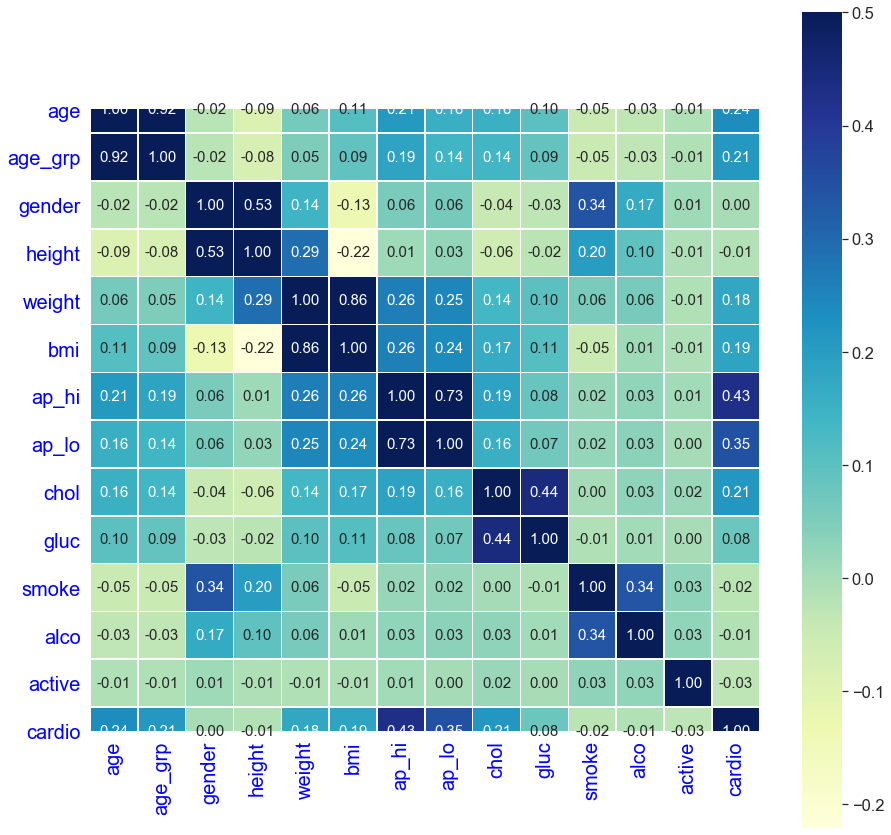

In [78]:
# Creating a correlation matrix
import matplotlib.pylab as pylab
fig = plt.figure(figsize=(15,15))
sns.set(font_scale = 1.5)
healthmat = cardio_df.corr()
sns.heatmap(healthmat, vmax = .5, square = True, annot=True, cmap="YlGnBu", linewidths=.5, fmt='.2f',
                 annot_kws={'size':15},  cbar=True)

plt.xticks(size = 20, color='blue' )
plt.yticks(size = 20, color='blue')


plt.show()

#### We can see in the heatmap that the age and age_grp, weight and bmi is highly correlated to each other(0.92, 0.86 ) respectively. Removing highly correlated feature and zero correlation to target like gender can help reduce overfitting and training time.

### Drop high correlated between features and zero correlated to target(Data Used in Training)

In [79]:
#make a data_frame to used in training by dropping some columns
cardio_final = cardio_df.drop(columns=['age_grp', 'gender', 'height', 'weight'])

Text(0, 0.5, 'ylabel')

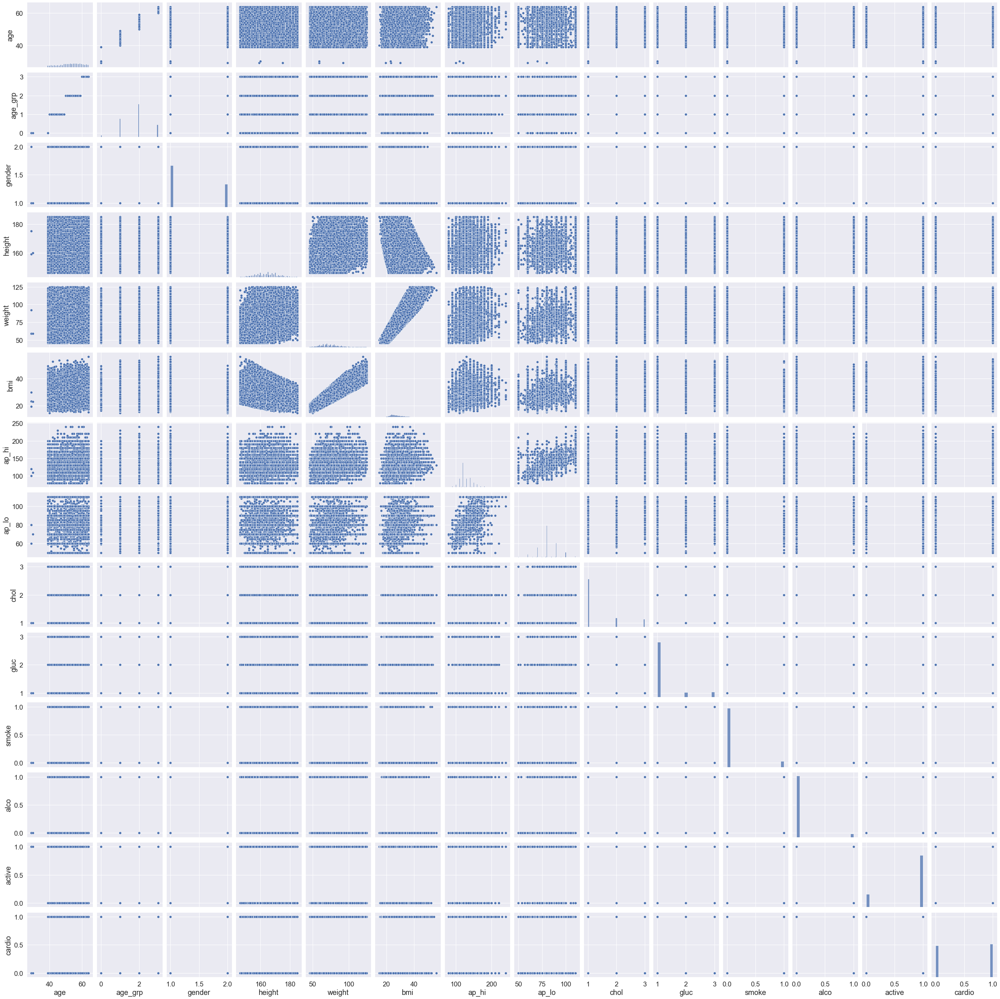

In [80]:
sns.pairplot(cardio_df)
plt.xticks(size = 15, color='blue' )
plt.yticks(size = 15, color='blue')
plt.xlabel('xlabel', fontsize=20, color='red' )
plt.ylabel('ylabel', fontsize=20, color='red')


### Categorical Feature Visual

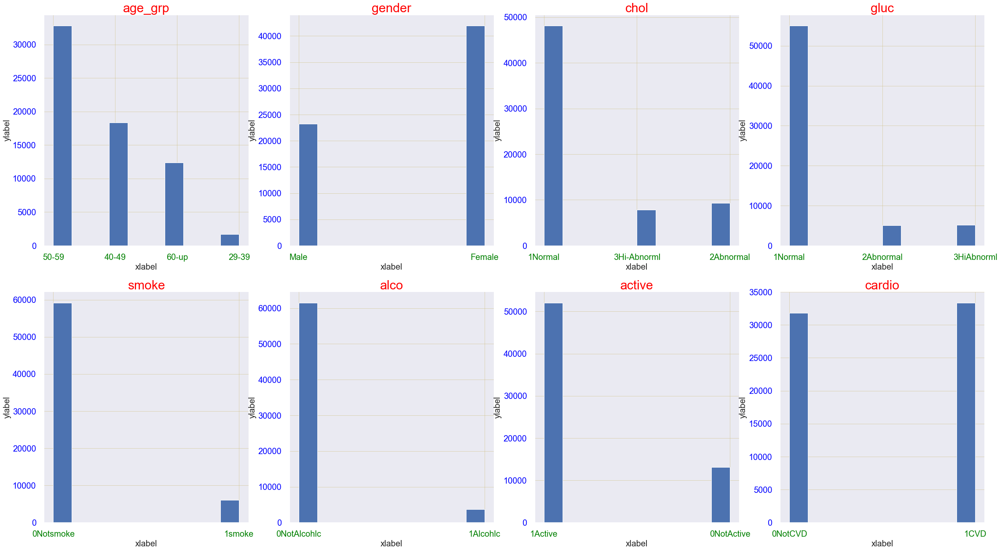

In [81]:
#dictionary of columns.
dic_cat

plt.figure(figsize=(40,40))

for variable,i in dic_cat.items():
    plt.subplot(4,4,i)
    plt.hist(cardio_df_vis[variable])
  
    plt.xlabel('xlabel', fontsize=20)
    plt.ylabel('ylabel', fontsize=20)
    plt.tick_params(direction='out', length=15, width=10, colors='y',
               grid_color='y', grid_alpha=0.5)
    plt.xticks(size = 20, color='green' )
    plt.yticks(size = 20, color='blue')
    plt.title(variable, size = 30, color='red')
    plt.subplots_adjust(top=1)

#### We can see the unique values count on each categorical feature. We can observe that the each of the features have large differences, only the target feature cardio that is almost same value counts. Target Features % division below in the pie chart.

- AGE_GRP
 Number of Unique Values:  4 <br>
 
 2 = 50-59 --> 32797 <br>
 1 = 40-49 --> 18347 <br>
 3 => 60-up --> 12391 <br>
 0 = 29-39 --> 1665 <br>
 

===============
- GENDER <br>
Number of Unique Values:  2 <br>
1  = Female -->  41951 <br>
2  = Male   -->  23249 <br>

===============
- CHOL
Number of Unique Values:  3 <br>
1  = Normal       -->  48124 <br>
2  = Abnormal     -->   9267 <br>
3  = Hi-Abnormal  -->   7809 <br>

===============
- GLUC
Number of Unique Values:  3 <br>
1  = Normal      -->  55009 <br>
3  = Abnormal    -->   5151 <br>
2  = Hi-Abnormal -->   5040 <br>

===============
- SMOKE
Number of Unique Values:  2 <br>
0  = NotSmoke -->  59203 <br>
1  = Smoke    -->   5997 <br>

===============
- ALCO
Number of Unique Values:  2 <br>
0  = NotAlcoholic -->  61540 <br>
1  = Alcoholic    -->   3660 <br>

===============
- ACTIVE
Number of Unique Values:  2 <br>
1  = Active    -->  52071 <br>
0  = NotActive -->  13129 <br>

===============
- CARDIO
Number of Unique Values:  2 <br>
1  = CVD    -->  33375 <br>
0  = NotCVD -->  31825 <br>

===============

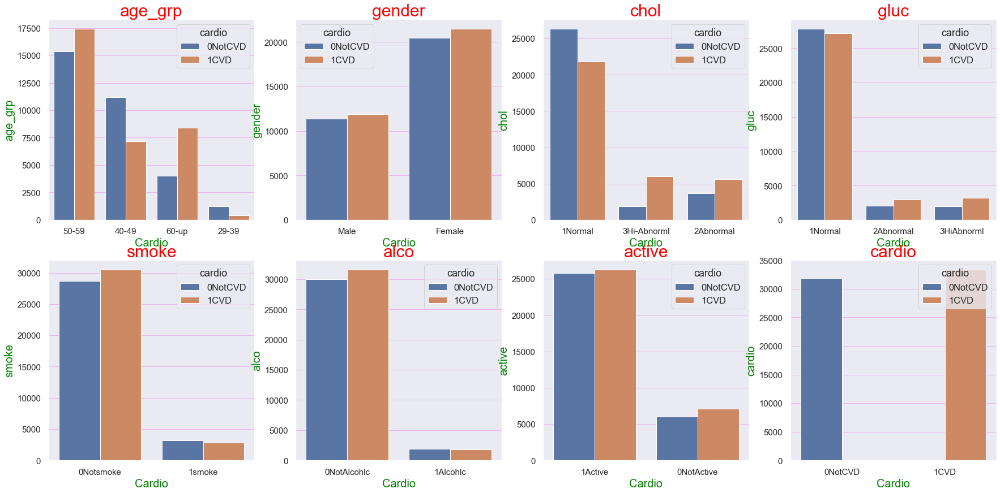

In [82]:
# dictionary of continous.

# Detect outliers in each variable using box plots.
plt.figure(figsize=(30,30))

for var,i in dic_cat_vis.items():
    plt.subplot(4,4,i)

    sns.countplot(x=var, hue='cardio', data = cardio_df_vis)
    plt.title(var, size=30, color = 'red')
    plt.xlabel('Cardio', fontsize=20, color='green')
    plt.ylabel(var, fontsize=20, color='green')
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.tick_params(direction='out', length=10, width=5, grid_color='violet', grid_alpha=0.5)
    

#### categorical fields and cholesterol by target cardio

- gender = Either male and female have higher CVD than Not CVD.
- chol = We can see that there are less CVD in patients w/ normal cholesterol and more CVD in those with abnormal Cholesterol.
- gluc = Those with normal glucose have less CVD compared with those abnormal glucose that have higher number of CVD.
- smoke = Those who smoke have higher number of CVD, Not smoker have less number of CVD.
- alco = It is surprising that Not Alcoholic have higher CVD and Alcoholic have same number of CVD and Not CVD. The balance of the data may have something to do w/ it. Not alcohoic is 60K plus and alcoholic data is only about 3K.
- active = Also weird that the active has higher CVD and understantandable that Not Active has higher CVD.
- age_grp = There are highest data in the older patient 50-59 and smallest data on the 29-39. But we can observed that there is less CVD on the younger age from 40-29 yrs old range and more CVD in the older people.

### Continuous Feature Visual

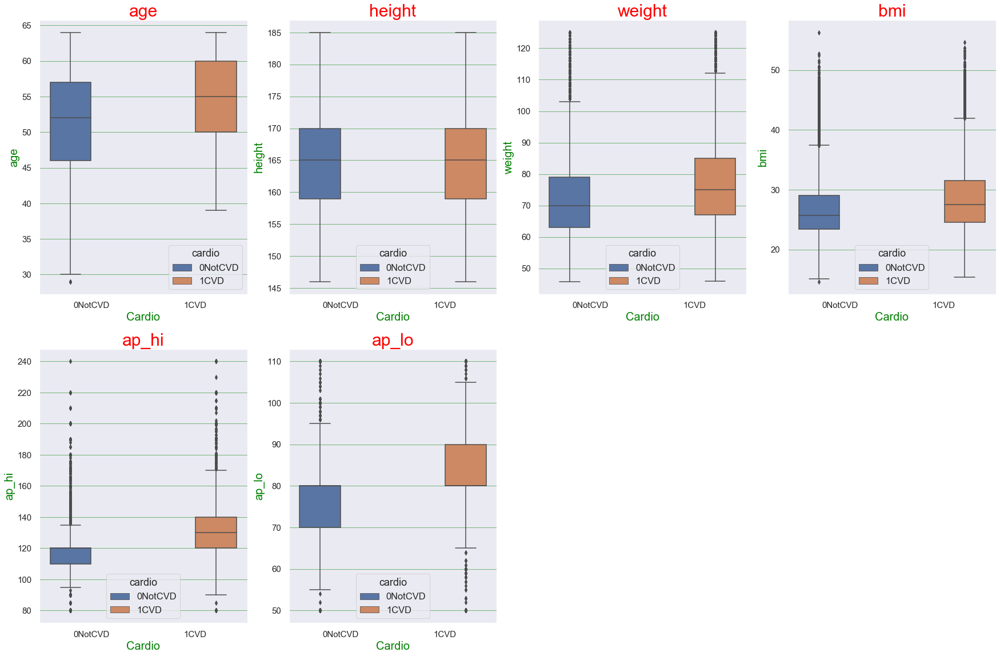

In [83]:
# dictionary of continous.
dic_cont_vis

# Detect outliers in each variable using box plots.
plt.figure(figsize=(30,30))

for var,i in dic_cont_vis.items():
    plt.subplot(3,4,i)
    
    sns.boxplot(x='cardio', y=cardio_df_vis[var],hue='cardio', data = cardio_df_vis)
    plt.title(var, size=30, color = 'red')
    plt.xlabel('Cardio', fontsize=20, color='green')
    plt.ylabel(var, fontsize=20, color='green')
    plt.xticks(size = 15)
    plt.yticks(size = 15)
    plt.tick_params(direction='out', length=10, width=5, grid_color='green', grid_alpha=0.5)
    


#Continous Fields by cardio Interquartile Range(IQR)
- age = NotCVD age IQR is about 46-56 and median about 53 lower than with CVD IQR 50-60 and median 56. Older people are prone to CVD.
- height = IQT and median is  equal. Height has little effect to CVD.
- weight = NotCVD weight IQR 62-79kg and median about 70kg lower than with CVD weight 68-85kg and median 75kg. People with CVD are heavier. 
- bmi = NotCVD BMI IQR about 23-28 and median 25 is lower than with CVD BMI IQR 25-32 and median 28. People with CVD has higher BMI.
- pulse = NotCVD IQR and median pulse is 40 is lower with CVD IQR 40-60 and median 45. People with CVD has higher pulse.
- ap_hi = NotCVD Systolic IQR and median 110-120 lower than with CVD IQR 120-140. People with CVD has high blood pressure.
- ap_lo = NotCVD Diastolic IQR and median 70-80 lower than with CVD IQR 80-90. People with CVD has high blood pressure.

### Target Feature Visual

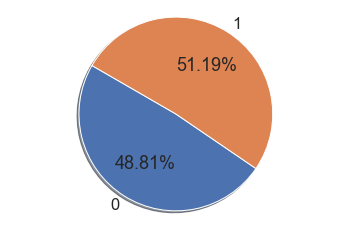

In [84]:
# Creates a pie chart that represents the target categories in our dataset

plt.pie(np.bincount(cardio_df['cardio']), labels=['0', '1'],
        autopct='%3.2f%%', shadow=True, startangle=150)
plt.axis('equal')

plt.xticks(size = 20, color='violet' )
plt.yticks(size = 20, color='violet')

plt.show()

This visualization shows the division of the labeled Target variable. The Cardiovascular Disease is 51.19% and NOT Cardiovascular Disease is almost 48.81%. They are almost the same so there is no need to resample and balance them to make them equal.

#### <center> [Back to Top](#TABLE)  

## <font color='red'>5. CREATE TRAINING AND TESTING DATASET<a name="TRAINING/TESTING"></a>

In [85]:
# split the dataframe into target and features

df_target = cardio_final['cardio']#dependent features
df_features = cardio_final.drop(columns =['cardio'])#independent features

In [86]:
X = np.array(df_features)
y = np.array(df_target)

In [87]:
#spliting the data in to test and train sets
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)



### 5.1 Feature Scaling
- Apply feature scaling after the split to avoid information leakage.

In [88]:
from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()
X_train_sc = sc_X.fit_transform(X_train)
X_test_sc = sc_X.transform(X_test)

#### <center> [Back to Top](#TABLE)  

## <font color='red'>6. TRAIN AND TEST MODEL IN SK-LEARN NOT USING SAGEMAKER<a name="SK-LEARN"></a>

### 6.1 Hyperparameter tuning on Multiple Models – Regression<a name="Hyperparameter"></a>

In [89]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


You should consider upgrading via the 'python -m pip install --upgrade pip' command.


In [90]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score,recall_score,f1_score

from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
#from sklearn.gaussian_process import GaussianProcessClassifier
#from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
#from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
#from sklearn.inspection import DecisionBoundaryDisplay
from xgboost import XGBClassifier

In [91]:
classifier = [
    LogisticRegression(),
    KNeighborsClassifier(),
    DecisionTreeClassifier(),
    RandomForestClassifier(),
    AdaBoostClassifier(),
    GaussianNB(),
    SVC(),
    XGBClassifier()
]

In [92]:
from time import time

head = 10
for model in classifier[:head]:
    start = time()
    model.fit(X_train_sc, y_train)
    train_time = time() - start
    start = time()
    y_pred = model.predict(X_test_sc)
    #y_pred = model.predict(X_test)#use this if not scale
    predict_time = time()-start    
    print(model)
    print("\tTraining time: %0.3fs" % train_time)
    print("\tPrediction time: %0.3fs" % predict_time)
    print("ACCURACY: {:.2f} %".format(accuracy_score(y_test, y_pred)*100))
    print("PRECISION: {:.2f} %".format(precision_score(y_test, y_pred)*100))
    print("RECALL: {:.2f} %".format(recall_score(y_test, y_pred)*100))
    print("F1-SCORE: {:.2f} %".format(f1_score(y_test, y_pred)*100))
    print()

LogisticRegression()
	Training time: 0.050s
	Prediction time: 0.000s
ACCURACY: 72.62 %
PRECISION: 75.02 %
RECALL: 69.80 %
F1-SCORE: 72.32 %

KNeighborsClassifier()
	Training time: 0.139s
	Prediction time: 1.312s
ACCURACY: 68.44 %
PRECISION: 69.32 %
RECALL: 68.91 %
F1-SCORE: 69.11 %

DecisionTreeClassifier()
	Training time: 0.172s
	Prediction time: 0.000s
ACCURACY: 62.47 %
PRECISION: 63.76 %
RECALL: 62.02 %
F1-SCORE: 62.88 %

RandomForestClassifier()
	Training time: 4.659s
	Prediction time: 0.328s
ACCURACY: 66.53 %
PRECISION: 66.92 %
RECALL: 68.58 %
F1-SCORE: 67.74 %

AdaBoostClassifier()
	Training time: 1.014s
	Prediction time: 0.062s
ACCURACY: 72.80 %
PRECISION: 76.34 %
RECALL: 67.99 %
F1-SCORE: 71.93 %

GaussianNB()
	Training time: 0.016s
	Prediction time: 0.000s
ACCURACY: 70.93 %
PRECISION: 76.42 %
RECALL: 62.59 %
F1-SCORE: 68.82 %

SVC()
	Training time: 87.113s
	Prediction time: 36.590s
ACCURACY: 72.87 %
PRECISION: 75.81 %
RECALL: 69.12 %
F1-SCORE: 72.31 %

XGBClassifier()
	Trainin

#### We can see that highest accuracy is XGBClassifier. Accuracy is not enough to assess the performance of a classifier. It is also important to put into the consideration the precision, recall and F1-score. F1 is the overall model's accuracy that combine precision and recall. About this data, Type 11 error(FP) where Recall is more important. SVC has higher F1 score but XGBoost classifier has higher recall that is more important in these data. In here, the best model to chose is XGBoost. But we can take the two best models and find their best parameters by applying Gridsearchcv to check if we can improve their metrics.

### 6.2 Apply Gridsearchcv for best parameter for the 2 best Model then Evaluate<a name="Gridsearchcv"></a>

### 6.2.1 Training the XGBClassifier model on the Training set

- XGBoost or Extreme Gradient Boosting ALgorithm is one of the most powerful algorithm to perform both regresion and classification tasks.
- XGBoost  is a supervised learning algorithm and implements gradient boosted trees algorithm.
- The algorrithm work by combining an ensemble of predictions from several weak models.
- It is an ensemble algorithm, it is very robust and could work well w/ several data types and complex distributions.
- Has tunable hyperparameters that could improve  model fitting.
- Ensemble Techniques such as bagging and boosting can reduce variance and overfitting and increase model robustness.

In [93]:
param_grid = {
        'gamma': [0.5, 1, 5],   # regularization parameter 
        'subsample': [0.6, 0.8, 1.0], # % of rows taken to build each tree
        'colsample_bytree': [0.6, 0.8, 1.0], # number of columns used by each tree
        'max_depth': [3, 4, 5] # depth of each tree
        }

from sklearn.model_selection import GridSearchCV
parameters = [{"max_depth": [1,2,3,4,5,6,7,8,9],  # depth of each tree
         "min_child_weight": [1, 2, 3],
         "subsample": [0.5,0.6,0.7,0.8,0.9, 1.0], # number of columns used by each tree
         "eta": [1e-4,1e-3,1e-2,1e-1]}]
grid_search = GridSearchCV(estimator = classifier,
                           param_grid = parameters,
                           scoring = 'accuracy',
                           cv = 10,
                           n_jobs = -1)
grid_search.fit(X_train, y_train)
best_accuracy = grid_search.best_score_
best_parameters = grid_search.best_params_
print("Best Accuracy: {:.2f} %".format(best_accuracy*100))
print("Best Parameters:", best_parameters)

Best Accuracy: 73.25 %
Best Parameters: {'eta': 0.1, 'max_depth': 6, 'min_child_weight': 3, 'subsample': 0.8}

### Training XGBoost on the Training set

In [94]:
from xgboost import XGBClassifier
classifier_xgb = XGBClassifier(eta= 0.1, max_depth= 6, min_child_weight= 3, subsample=0.8)
classifier_xgb.fit(X_train, y_train)

XGBClassifier(eta=0.1, max_depth=6, min_child_weight=3, subsample=0.8)

In [95]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score,recall_score,f1_score
y_pred_xgb = classifier_xgb.predict(X_test)
print("CONFUSION MATRIX")
cm = confusion_matrix(y_test, y_pred_xgb)
print(cm)
print('================')
print("ACCURACY: {:.2f} %".format(accuracy_score(y_test, y_pred_xgb)*100))
print("PRECISION: {:.2f} %".format(precision_score(y_test, y_pred_xgb)*100))
print("RECALL: {:.2f} %".format(recall_score(y_test, y_pred_xgb)*100))
print("F1-SCORE: {:.2f} %".format(f1_score(y_test, y_pred_xgb)*100))

CONFUSION MATRIX
[[4830 1527]
 [1943 4740]]
ACCURACY: 73.39 %
PRECISION: 75.63 %
RECALL: 70.93 %
F1-SCORE: 73.20 %


ACCURACY: 73.59 %
PRECISION: 75.57 %
RECALL: 70.80 %
F1-SCORE: 73.11 %

After parameter gridsearch
- ACCURACY: 73.48 % decrease from 73.49%
- PRECISION: 75.40 % increase from 77.26 %
- RECALL: 70.80 % decrease from 69.15 %
- F1-SCORE: 73.03 % decrease from 72.98 %

### Applying k-Fold Cross Validation

In [96]:
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(estimator = classifier_xgb, X = X_train, y = y_train, cv = 5)
print("CROSS VALIDATION: ", (accuracies))
print("AVERAGE ACCURACY: {:.2f} %".format(accuracies.mean()*100))
print("STANDARD DEVIATION: {:.2f} %".format(accuracies.std()*100))

CROSS VALIDATION:  [0.72986963 0.72632285 0.74041411 0.72622699 0.73571702]
AVERAGE ACCURACY: 73.17 %
STANDARD DEVIATION: 0.56 %


Checking Model for Overfitting
- Overfitting model tend to perform very well on the training dataset but poorly on any new dataset(testing dataset). The accuracy in the testing dataset is 73.33 % comparing to the average accuracy of the training dataset in the cross validation w/c is 73.04%. The model perform almost the same in the training and testing, so this shows that there is not overfitting. The model were able to generalized the data and not memorized it.

### 6.2.2 Training the SVC model on the Training set

from sklearn.model_selection import GridSearchCV 
parameters = [{'C': [0.25, 0.5, 0.75, 1], 'kernel': ['linear']}, {'C': [0.25, 0.5, 0.75, 1], 'kernel': ['rbf'], 'gamma': [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]}] 
grid_search = GridSearchCV(estimator = classifier_SVC, param_grid = parameters, scoring = 'accuracy', cv = 10, n_jobs = -1) 
grid_search.fit(X_train, y_train) 
best_accuracy = grid_search.best_score_ 
best_parameters = grid_search.best_params_ 
print("Best Accuracy: {:.2f} %".format(best_accuracy*100)) 
print("Best Parameters:", best_parameters)

#### tool about 14 hours to find best parameter
- Best Accuracy: 72.48 %
- Best Parameters: {'C': 1, 'kernel': 'linear'}

In [97]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()
X_train_sc = sc.fit_transform(X_train)
X_test_sc = sc.transform(X_test)

In [98]:
from sklearn.svm import SVC
classifier_SVC = SVC( C = 1, kernel = 'linear')
classifier_SVC.fit(X_train_sc, y_train)

SVC(C=1, kernel='linear')

### Making the Confusion Matrix

In [99]:
from sklearn.metrics import confusion_matrix, accuracy_score
y_pred_SVC = classifier_SVC.predict(X_test_sc)
cm_SVC = confusion_matrix(y_test, y_pred_SVC)
print("CONFUSION MATRIX: \n", cm_SVC)
print()
print("ACCURACY: {:.2f} %".format(accuracy_score(y_test, y_pred_SVC)*100))
print("PRECISION: {:.2f} %".format(precision_score(y_test, y_pred_SVC)*100))
print("RECALL: {:.2f} %".format(recall_score(y_test, y_pred_SVC)*100))
print("F1-SCORE: {:.2f} %".format(f1_score(y_test, y_pred_SVC)*100))

CONFUSION MATRIX: 
 [[5005 1352]
 [2239 4444]]

ACCURACY: 72.46 %
PRECISION: 76.67 %
RECALL: 66.50 %
F1-SCORE: 71.22 %


- ACCURACY: 72.42 % decrease from 73.49%
- PRECISION: 77.41 % increase from 77.26 %
- RECALL: 65.98 % decrease from 69.15 %
- F1-SCORE: 71.24 % decrease from 72.98 %

### Apply Cross Validation on Train Model

In [100]:
from sklearn.model_selection import cross_val_score
accuracies = cross_val_score(estimator = classifier_SVC, X = X_train_sc, y = y_train, cv = 5)
print("CROSS VALIDATION: ", (accuracies))
print("AVERAGE ACCURACY: {:.2f} %".format(accuracies.mean()*100))
print("STANDARD DEVIATION: {:.2f} %".format(accuracies.std()*100))

CROSS VALIDATION:  [0.72268021 0.71481979 0.73332055 0.72335123 0.7220092 ]
AVERAGE ACCURACY: 72.32 %
STANDARD DEVIATION: 0.59 %


### 6.3 ROC-AUC

In [101]:
from xgboost import XGBClassifier
classifier_xgb = XGBClassifier(eta= 0.1, max_depth= 6, min_child_weight= 3, subsample=0.8)
classifier_xgb.fit(X_train, y_train)

y_pred_xgb_auc = classifier_xgb.predict_proba(X_test)[:,1]

In [102]:
from sklearn.svm import SVC
classifier_SVC = SVC( C = 1, kernel = 'linear')
classifier_SVC.fit(X_train_sc, y_train)

y_pred_svm_auc = classifier_SVC.decision_function(X_test_sc)

### 6.3.1 Plot ROC and compare AUC

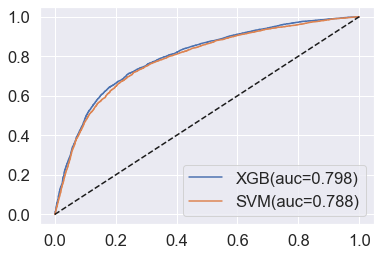

In [103]:
from sklearn.metrics import roc_curve, auc

xgb_fpr, xgb_tpr, threshold = roc_curve(y_test, y_pred_xgb_auc)
auc_xgb = auc(xgb_fpr, xgb_tpr)

svm_fpr, svm_tpr, threshold = roc_curve(y_test, y_pred_svm_auc)
auc_svm = auc(svm_fpr, svm_tpr)

#plt.figure(figsize=(5,5), dpi=100)
plt.figure()
plt.plot(xgb_fpr, xgb_tpr, linestyle="-", label="XGB(auc=%0.3f)"% auc_xgb)
plt.plot(svm_fpr, svm_tpr, linestyle="-", label="SVM(auc=%0.3f)"% auc_svm)

plt.plot([0, 1], [0, 1], 'k--')
plt.legend(loc="lower right")
plt.show()

#### The blue line is XGBoost and orange line is SVM, It represent the Area Under the Curve of the Receiver Operating Characteristic(AUROC). The diagonal dashed black line represents the ROC curve of a random predictore with AUROC of 0.5. The Higher the AUC, the better the model is at predicting 0's as 0's and 1's as 1's. So we can see here that XGBoost model is better than the SVM model.


#### <center> [Back to Top](#TABLE)  

## <font color='red'>7. TRAIN/TUNE/DEPLOY MODEL USING SAGEMAKER STUDIO<a name="using-sagemaker"></a> 

### [Sagemaker Studio (click to view)](http://localhost:8888/notebooks/AWS%20Practical/4.%20Cardiovascular%20Disease%20Prediction/cardiovascular_disease_prediction_notebook%20(1).ipynb)

## <font color='red'>8. SAGEMAKER AUTOPILOT<a name="Autopilot"></a>

### [Sagemaker AutoPilot(click to view)](http://localhost:8888/notebooks/AWS%20Practical/4.%20Cardiovascular%20Disease%20Prediction/SageMakerAutopilotDataExplorationNotebook.ipynb)

## <font color='red'>9. SAGEMAKER CANVAS<a name="canvas"></a>

#### <center> [Back to Top](#TABLE)  

## <font color='red'>10. PERFORM DIMENSIONALITY REDUCTION USING PRINCIPAL COMPONENT ANALYSIS<a name="PCA"></a>

- PCA is an unsupervised machine learning algorithm that performs dimensionality reduction  while attempting at keeping the original information unchanged.
- PCA works by trying to find a new set of features called components.
- Components are compdsites of the uncorrelated given input features.
- In Amazon Sagemaker PCA operates in two modes:
    1. Regular = works well w/ sparse data small(manageable) number of observations/features.
    2. Ramdomized = workes well w/ large number of observations/features.

### 10.1 DIMENSIONALITY REDUCTION USING PCA (SKLEARN)<a name="PCA-SKLEARN"></a>

In [104]:
from sklearn.decomposition import PCA
pca = PCA(n_components = 6)

X_train_pca = pca.fit_transform(X_train)
X_test_pca = pca.transform(X_test)

### 10.1.2 XGBoost Classifier(PCA)

In [105]:
from xgboost import XGBClassifier
xgbclassification_pca = XGBClassifier() 
xgbclassification_pca.fit(X_train_pca, y_train)

XGBClassifier()

In [106]:
y_pred_xgb = xgbclassification_pca.predict(X_test_pca)
df_val_xgb = pd.DataFrame({'Predicted Values': y_pred_xgb, 'Real Values':  y_test.ravel()})
df_val_xgb

,Predicted Values,Real Values
0,0,0
1,1,1
2,1,0
3,0,1
4,1,1
...,...,...
13035,0,0
13036,1,0
13037,1,0
13038,1,1


## Making the Confusion Matrix & Checking Accuracy

In [107]:
## Making the Confusion Matrix & Checking Accuracy

from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
#y_pred_xgb = classifier_LR.predict(X_test)
cm_xgb = confusion_matrix(y_test, y_pred_xgb)
print("CONFUSION MATRIX: \n", cm_xgb)
print()
print("ACCURACY: {:.2f} %".format(accuracy_score(y_test, y_pred_xgb)*100))
print("PRECISION: {:.2f} %".format(precision_score(y_test, y_pred_xgb)*100))
print("RECALL: {:.2f} %".format(recall_score(y_test, y_pred_xgb)*100))
print("F1-SCORE: {:.2f} %".format(f1_score(y_test, y_pred_xgb)*100))

CONFUSION MATRIX: 
 [[4852 1505]
 [1990 4693]]

ACCURACY: 73.20 %
PRECISION: 75.72 %
RECALL: 70.22 %
F1-SCORE: 72.87 %


## Applying k-Fold Cross Validation

In [108]:
from sklearn.model_selection import cross_val_score
accuracies_K_FOLD_xgb = cross_val_score(estimator = xgbclassification_pca, X = X_train, y = y_train, cv = 5)
print("CROSS VALIDATION: ", (accuracies_K_FOLD_xgb))
print("AVERAGE ACCURACY: {:.2f} %".format(accuracies_K_FOLD_xgb.mean()*100))
print("STANDARD DEVIATION: {:.2f}".format(accuracies_K_FOLD_xgb.std()*100))

CROSS VALIDATION:  [0.73034893 0.72220092 0.73916794 0.73159509 0.73418328]
AVERAGE ACCURACY: 73.15 %
STANDARD DEVIATION: 0.55


### 10.2 DIMENSIONALITY REDUCTION USING PCA (SAGEMAKER)<a name="PCA"></a>

### [Sagemaker Studio (click to view)](https://d-5na4ikhgvf48.studio.us-east-1.sagemaker.aws/jupyter/default/lab?sagemaker-share-id=rSeyK7fJG19AjEap9jLiYGpdQeMwpNYVuY-p2xM6peI%3D)

#### <center> [Back to Top](#TABLE)  

## <font color='red'>11. USE DEEP LEARNING ARTIFICIAL NEURAL NETWORK(ANN) - CLASSIFICATION MODEL<a name="Deep-learning"></a>

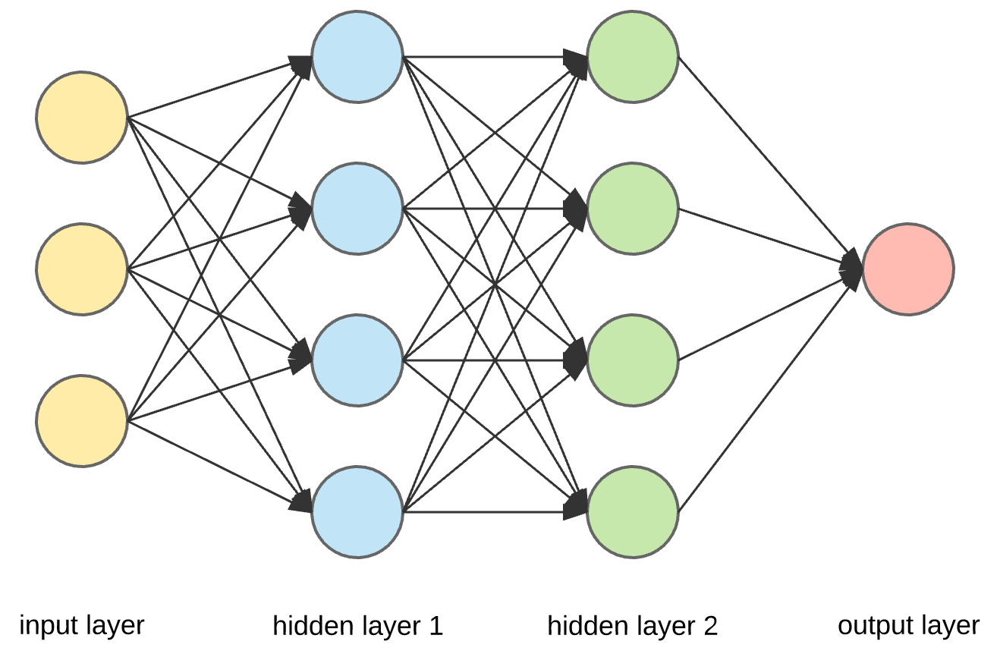

In [109]:
#Compulsory in DeepLearning, apply to all features to both training and test set. 
#We apply feature scaling to all our features, regardless of whether they already have some values of zero and one,

from sklearn.preprocessing import StandardScaler
sc_X = StandardScaler()
sc_y = StandardScaler()
X_train_sc = sc_X.fit_transform(X_train)#fitted to training set to avoid information leakage
X_test_sc = sc_X.transform(X_test)

### ANN 2

In [110]:
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Dense, Activation, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam


In [111]:
!pip install tensorflow

Traceback (most recent call last):
  File "C:\Users\catan\.conda\envs\catanEnv\Scripts\pip-script.py", line 6, in <module>
    from pip._internal.cli.main import main
ModuleNotFoundError: No module named 'pip._internal.cli.main'


In [112]:
tf.__version__

'2.1.0'

In [113]:
ANN_model = tf.keras.Sequential()#ANN built in sequential fashion

In [114]:
ANN_model.add(Dense(50, input_dim = 9))#50 connected Neurons and features(independent variable)
#Dense means connection from input to neurons

ANN_model.add(Activation('sigmoid'))
ANN_model.add(Dense(150))

ANN_model.add(Activation('sigmoid'))
ANN_model.add(Dropout(0.5))
ANN_model.add(Dense(150))

ANN_model.add(Activation('sigmoid'))
ANN_model.add(Dropout(0.5))
ANN_model.add(Dense(100))

#ANN_model.add(Activation())#output activation is linear cause regression problem w/ 1 neurons
#ANN_model.add(Dense(1))

#for regresion used the default which is no activation function
ANN_model.add(Activation('sigmoid'))
ANN_model.add(tf.keras.layers.Dense(units=1))

ANN_model.compile(loss = 'binary_crossentropy', optimizer = 'adam')
ANN_model.summary()

#for classification activation function is sigmoid or softmax
#sigmoid used for classification 2 category like yes or no
#more than 2 category used softmax activation function
#for regresion used the default which is no activation function
# units is number of neurons
# activation used to break linearity between input and 1st hidden layer
# we can put any units=number of hidden layer neuron, the inputs 4 independent variable is automatically recognize

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 50)                500       
_________________________________________________________________
activation (Activation)      (None, 50)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 150)               7650      
_________________________________________________________________
activation_1 (Activation)    (None, 150)               0         
_________________________________________________________________
dropout (Dropout)            (None, 150)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 150)               22650     
_________________________________________________________________
activation_2 (Activation)    (None, 150)               0

In [115]:
ANN_model.compile(optimizer='Adam', loss='binary_crossentropy', metrics = ['accuracy'])

#epochs_hist = ANN_model.fit(X_train_sc, y_train, epochs = 100, batch_size = 32, validation_split = 0.2)
ANN_model.fit(X_train_sc, y_train, epochs = 100, batch_size = 32, validation_split = 0.2)

Train on 41728 samples, validate on 10432 samples
Epoch 1/100
41728/41728 [==============================] - 6s 155us/sample - loss: 0.7033 - accuracy: 0.5870 - val_loss: 0.5717 - val_accuracy: 0.7124
Epoch 2/100
41728/41728 [==============================] - 6s 140us/sample - loss: 1.7670 - accuracy: 0.5905 - val_loss: 0.6123 - val_accuracy: 0.6914
Epoch 3/100
41728/41728 [==============================] - 6s 132us/sample - loss: 0.6824 - accuracy: 0.6306 - val_loss: 0.5942 - val_accuracy: 0.7194
Epoch 4/100
41728/41728 [==============================] - 5s 127us/sample - loss: 0.6267 - accuracy: 0.6821 - val_loss: 0.5823 - val_accuracy: 0.7171
Epoch 5/100
41728/41728 [==============================] - 5s 127us/sample - loss: 0.6195 - accuracy: 0.6930 - val_loss: 0.5840 - val_accuracy: 0.7173
Epoch 6/100
41728/41728 [==============================] - 5s 127us/sample - loss: 0.6172 - accuracy: 0.6894 - val_loss: 0.5771 - val_accuracy: 0.7226
Epoch 7/100
41728/41728 [===================

In [116]:
#Comparing and putting the predicted output and the actual output to see the difference.
y_pred = ANN_model.predict(X_test_sc)
y_pred = (y_pred > 0.5)
print(np.concatenate((y_pred.reshape(len(y_pred),1), y_test.reshape(len(y_test),1)),1))

[[0 0]
 [1 1]
 [1 0]
 ...
 [1 0]
 [1 1]
 [1 1]]


## Making Confusion Matrix and Checking Accuracy, Precision, Recall

In [117]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score
cm_LR = confusion_matrix(y_test, y_pred)
print("CONFUSION MATRIX: \n", cm_LR)
print()
print("ACCURACY: {:.2f} %".format(accuracy_score(y_test, y_pred)*100))
print("PRECISION: {:.2f} %".format(precision_score(y_test, y_pred)*100))
print("RECALL: {:.2f} %".format(recall_score(y_test, y_pred)*100))
print("F1-SCORE: {:.2f} %".format(f1_score(y_test, y_pred)*100))

CONFUSION MATRIX: 
 [[4763 1594]
 [1920 4763]]

ACCURACY: 73.05 %
PRECISION: 74.93 %
RECALL: 71.27 %
F1-SCORE: 73.05 %


After experementing the number of neurons, we are able to come out with the result above with ACCURACY: 73.27 %, PRECISION: 76.58 % and RECALL: 68.82 %. We all know that ACCURACY closer to 1 implies a better model and less error. We can improve more this model but we should also becarefull cause adding additional neurons and increasing the complexity of the model is not necessarily the solution. We can do drop out some neurons and need to find a good balance between optimizing the network and basically obtaining good and solid results while achieving a model generalization and avoiding overfitting(memorizing the data).

#### <center> [Back to Top](#TABLE)  

## <font color='green'> 12. CONCLUSION:</font> <a name="CONCLU"></a>

- Store the categorical Cardio Data to S3 and run it to predict cardiovascular disease in Local Machine Jupyter, AWS Sagemaker Studio, AWS Studiolab, Deep Learning and in AWS Autopilot. 
- Run and experimented in different tools to see the differences and to learn from them.
- Fixed some of the data and visualized using AWS Quicksight, Matplotlib, Seaborn to understand more about the data.
- Applied Gridsearch, parameter tuning to get the best model and parameters. Results listed below. 
- All are base on The Jupyter Notebook, an open source web application that we can use to create and share documents that contain live code, equations, visualizations, and text.
- We observed below that using Sk-learn has highest accuracy and F1-score. But all result using different tools has almost same accuracy, F1 result with difference about 1%. Cross validation was done to check for overfitting by compare the test and training result. It depends now what tools we used, all have the advantages. Sagemaker studio and AutoPilot is all in one. We can build, analyze, train, test and deploy models integrated w/ unlimited storage S3. In Scikit-learn, it is free but have some limitation.


#### <center> [Back to Top](#TABLE)  

### <font color='green'>RESULTS:

### 1. SCIKIT-LEARN
>One of the most widely used machine learning packages on GitHub is Python's scikit-learn. It is a free machine learning library for Python. It supports both supervised and unsupervised machine learning, providing diverse algorithms for classification, regression, clustering, and dimensionality reduction. The library is built using many libraries such as NumPy, SciPy, Pandas, Matplotlib and Seaborn, etc.
#### Best Model After Gridsearch and Parameter Tuning (XGBoost)
- CONFUSION MATRIX

[[4829 1537]

[1941 4733]]

================

- ACCURACY: 73.33 %

- PRECISION: 75.49 %

- RECALL: 70.92 %

- F1-SCORE: 73.13 %

- AUC: 81%

================

- CROSS VALIDATION:  [0.73217025 0.72862347 0.7322661  0.72929448 0.72977377]

- AVERAGE ACCURACY: 73.04 %

- STANDARD DEVIATION: 0.15 %

### 2. SCIKIT-LEARN(PCA)
>Principal component analysis(PCA) is a dimensionality-reduction method that is often used to reduce the dimensionality of large data sets, by transforming a large set of variables into a smaller one that still contains most of the information in the large set. Because smaller data sets are easier to explore and visualize and make analyzing data much easier and faster for machine learning algorithms without extraneous variables to process.
#### No. of component = 6
- CONFUSION MATRIX: 
 
 [[4930 1436]
 
 [2018 4656]]
 
================

- ACCURACY: 73.51 %

- PRECISION: 76.43 %

- RECALL: 69.76 %

================

- CROSS VALIDATION:  [0.73504601 0.72977377 0.73418328 0.72843175 0.72919862]

- AVERAGE ACCURACY: 73.13 %

- STANDARD DEVIATION: 0.27



### 3. SAGEMAKER STUDIO
>AWS SageMaker Studio is the first fully integrated development environment (IDE) for machine learning. It provides a single, web-based visual interface where we can perform all ML development steps, improving data science productivity. SageMaker Studio gives us complete access, control, and visibility into each step required to build, analyze, train, test and deploy models.
#### Best Model After Tuning (Built-in XGBoost)
- CONFUSION MATRIX

[[4849 1506]
 
[2022 4663]]

================

- ACCURACY: 72.94 %
- PRECISION: 75.59 %
- RECALL: 69.75 %
- F1-SCORE: 72.55 %

================

- CROSS VALIDATION:  [0.73552531 0.7224885  0.73044479 0.73207439 0.73379985]
- AVERAGE ACCURACY: 73.09 %
- STANDARD DEVIATION: 0.45 %



### 4. SAGEMAKER STUDIO (applying PCA)
#### No. of component = 5

- ACCURACY: 71.25 %
- PRECISION: 71.38 %
- RECALL: 71.42 %


### 5. AUTOPILOT
>Amazon SageMaker Autopilot helps complete an end-to-end machine learning (ML) workflow by automating the steps of feature engineering, training, tuning, and deploying an ML model for inference. We provide SageMaker Autopilot with a tabular data set and a target attribute to predict. Then, SageMaker Autopilot automatically explores your data, trains, tunes, ranks and finds the best model. Finally, you can deploy this model to production for inference.
#### Best Model(WeightedEnsemble)
- CONFUSION MATRIX: 
 
 [[4972 2033]
 
 [1834 5162]]
 
================

- ACCURACY: 72.4 %
- PRECISION: 71.74 %
- RECALL: 73.78 %
- F1: 72.8%
- AUC: 79.3%


### 6. DEEP LEARNING
>Deep learning allows computers to learn independently and undertake tasks with little supervision, promising extraordinary benefits for both science and industry. Unlike traditional machine learning, deep learning attempts to simulate the way our brains learn and process information by creating artificial "neural networks" that can extract complicated concepts and relationships from data. Deep learning models improve through complex pattern recognition in pictures, text, sounds, and other data to produce more accurate insights and predictions.
- CONFUSION MATRIX: 
 
 [[4961 1405]
 
 [2081 4593]]

================

- ACCURACY: 73.27 %
- PRECISION: 76.58 %
- RECALL: 68.82 %


    


#### The highest accuracy is the Sci-kit learn(PCA) but we should not base our best model in the accuracy. In this type of data set, we should put more important to the type 2 error(False Negative) than the type 1 error(False Positive) because type II error, predicting patient w/o cardiovascular disease but actually the patient has the disease, this wrong prediction will put the patient in danger because he will not seek immediate medical attention for he though he dont have cardiovascular disease & will worsen his condition. So the best model w/ less type II error and higher recall percentage is AWS Autopilot Weighted Ensemble Model. Amazon SageMaker Autopilot helps complete an end-to-end machine learning (ML) workflow by automating the steps of feature engineering, training, tuning, and deploying an ML model for inference.
- ACCURACY: 72.4 %
- PRECISION: 71.74 % 
- RECALL: 73.78 % 
- F1: 72.8%.